Work done by:
<br> Pedro Miguel Silva Carvalho, id_number: 20230487 <br>
 Maria Fortunato, id_number: 20230382 <br> 
 Group 79 <br>
 Data Mining Project S1 2023/2024

<a name="top"></a> 
# Project Contents


* [Import needed libraires](#libraries)
* [Load Dataset](#load)
* [Inicial Exploration](#explore)
* [Data Types](#type)
* [Feature Split](#split)
* [Coherence Checking- First changes](#cc)
* [Feature Engeneering](#engenheiro)
* [Initial Visualizations](#visu)
* [Outliers](#outliers)
* [Metric Features Normalization](#norma)
* [Missing Values](#missing)
* [Treatment for Outliers DF](#treatout)
* [Extra Visualizations](#extra)
* [Feature Selection](#sele)
* [Clustering Method 1: Based on Value](#c1)
* [Clustering Method 2: Based on Demographics/Social Aspects](#c2)
* [Clustering Method 3: Based on Activities](#c3)
* [Combining clusters with hierarchical](#combine)
* [Outliers Reintroduction](#dt)

<a class="anchor" id="libraries">

## Import needed libraries
###### [Go back to Contents](#top)
</a>

In [3]:
#Preprocessing/general imports
import pandas as pd
import numpy as np
from sklearn.impute import KNNImputer #for k nearest neighbours
from sklearn.preprocessing import MinMaxScaler, StandardScaler #for normalization
import datetime

#not sure what these were for
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
import scipy.stats as stats
from scipy.stats import chi2_contingency
from sklearn.decomposition import PCA

#Clustering imports
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score, silhouette_samples
from kmodes.kprototypes import KPrototypes
from sklearn.neighbors import NearestNeighbors
from scipy.cluster.hierarchy import dendrogram

#For visualizations
import matplotlib.cm as cm
import seaborn as sns
import matplotlib.pyplot as plt
from math import ceil
from sklearn.manifold import TSNE
#For better resolution plots
%config InlineBackend.figure_format = 'retina' # optionally, you can change 'svg' to 'retina'

#Setting seaborn style
sns.set()

#for final decision trees
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

#import sompy
#from sompy.visualization.mapview import View2D
#from sompy.visualization.bmuhits import BmuHitsView
#from sompy.visualization.hitmap import HitMapView

#To avoid too many warnings in graphs
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=UserWarning, module="matplotlib")

<a class="anchor" id="load">

## Load dataset
###### [Go back to Contents](#top)
</a>

In [4]:
dataset=pd.read_csv("./XYZ_sports_dataset.csv",delimiter=";")
dataset.set_index("ID",inplace=True) #Making the ID the index for better organization
dataset.head(1)

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
10000,60,Female,5500.0,2019-09-03,2019-10-31,2019-07-01,2019-12-31,2019-10-30,1,89.35,...,0.0,9.0,7,NaN,6.28,2,0,0.0,0,0


<a class="anchor" id="explore">

## Inicial Exploration
###### [Go back to Contents](#top)
</a>

In [5]:
#Knowing all columns in the dataset
dataset.columns 

Index(['Age', 'Gender', 'Income', 'EnrollmentStart', 'EnrollmentFinish',
       'LastPeriodStart', 'LastPeriodFinish', 'DateLastVisit',
       'DaysWithoutFrequency', 'LifetimeValue', 'UseByTime',
       'AthleticsActivities', 'WaterActivities', 'FitnessActivities',
       'DanceActivities', 'TeamActivities', 'RacketActivities',
       'CombatActivities', 'NatureActivities', 'SpecialActivities',
       'OtherActivities', 'NumberOfFrequencies', 'AttendedClasses',
       'AllowedWeeklyVisitsBySLA', 'AllowedNumberOfVisitsBySLA',
       'RealNumberOfVisits', 'NumberOfRenewals', 'HasReferences',
       'NumberOfReferences', 'Dropout'],
      dtype='object')

In [6]:
#Exploring how many rows and columns in the dataset
dataset.shape

(14942, 30)

In [7]:
#Duplicates
dataset.duplicated().sum() 

1

In [8]:
dataset.drop_duplicates(keep='first',inplace=True) #We choose to keep the first occurence
dataset.duplicated().sum() #Delt with

0

<a class="anchor" id="type">

## Data Types
###### [Go back to Contents](#top)
</a>

After checking metadata for the variables after the inicial Data type exploration we recognized that some variables had wrong data types

In [9]:
#Initial types
dataset.dtypes

Age                             int64
Gender                         object
Income                        float64
EnrollmentStart                object
EnrollmentFinish               object
LastPeriodStart                object
LastPeriodFinish               object
DateLastVisit                  object
DaysWithoutFrequency            int64
LifetimeValue                 float64
UseByTime                       int64
AthleticsActivities           float64
WaterActivities               float64
FitnessActivities             float64
DanceActivities               float64
TeamActivities                float64
RacketActivities              float64
CombatActivities              float64
NatureActivities              float64
SpecialActivities             float64
OtherActivities               float64
NumberOfFrequencies           float64
AttendedClasses                 int64
AllowedWeeklyVisitsBySLA      float64
AllowedNumberOfVisitsBySLA    float64
RealNumberOfVisits              int64
NumberOfRene

In [10]:
#Changing the dates
dataset["EnrollmentStart"] = pd.to_datetime(dataset["EnrollmentStart"])
dataset["EnrollmentFinish"] = pd.to_datetime(dataset["EnrollmentFinish"])
dataset["LastPeriodStart"] = pd.to_datetime(dataset["LastPeriodStart"])
dataset["LastPeriodFinish"] = pd.to_datetime(dataset["LastPeriodFinish"])
dataset["DateLastVisit"] = pd.to_datetime(dataset["DateLastVisit"])
#Now the dates are stored in date time

In [11]:
#Transforming column values into binary {0,1} values - Used Int64 to preserve Nans

#Gender
dataset['Gender'] = dataset['Gender'].replace({"Female":1,"Male":0}) #Assign female to 1 and male to 0
# HasReferences
dataset['HasReferences'] = dataset['HasReferences'].astype("Int64")
#UseByTime
dataset['UseByTime'] = dataset['UseByTime'].astype("Int64")
# AthleticsActivities
dataset['AthleticsActivities'] = dataset['AthleticsActivities'].astype("Int64")
# WaterActivities
dataset['WaterActivities'] = dataset['WaterActivities'].astype("Int64")
# FitnessActivities
dataset['FitnessActivities'] = dataset['FitnessActivities'].astype("Int64")
# DanceActivities
dataset['DanceActivities'] = dataset['DanceActivities'].astype("Int64")
# TeamActivities
dataset['TeamActivities'] = dataset['TeamActivities'].astype("Int64")
# RacketActivities
dataset['RacketActivities'] = dataset['RacketActivities'].astype("Int64")
# CombatActivities
dataset['CombatActivities'] = dataset['CombatActivities'].astype("Int64")
# NatureActivities
dataset['NatureActivities'] = dataset['NatureActivities'].astype("Int64")
# SpecialActivities
dataset['SpecialActivities'] = dataset['SpecialActivities'].astype("Int64")
# OtherActivities
dataset['OtherActivities'] = dataset['OtherActivities'].astype("Int64")
# Dropout
dataset['Dropout'] = dataset['Dropout'].astype("Int64")

#All these columns are now of binary type

In [12]:
#Number of frequencies to int- This approach is easier to analyse 
dataset["NumberOfFrequencies"]=dataset["NumberOfFrequencies"].astype('Int64') #USED Int64 to preserve Nans

In [13]:
#Updated data types acording to metadata 
dataset.dtypes

Age                                    int64
Gender                                 int64
Income                               float64
EnrollmentStart               datetime64[ns]
EnrollmentFinish              datetime64[ns]
LastPeriodStart               datetime64[ns]
LastPeriodFinish              datetime64[ns]
DateLastVisit                 datetime64[ns]
DaysWithoutFrequency                   int64
LifetimeValue                        float64
UseByTime                              Int64
AthleticsActivities                    Int64
WaterActivities                        Int64
FitnessActivities                      Int64
DanceActivities                        Int64
TeamActivities                         Int64
RacketActivities                       Int64
CombatActivities                       Int64
NatureActivities                       Int64
SpecialActivities                      Int64
OtherActivities                        Int64
NumberOfFrequencies                    Int64
AttendedCl

In [14]:
#Inicial Description of our data
dataset.describe(include="all").T

,count,mean,min,25%,50%,75%,max,std
Age,14941.0,26.016732,0.0,19.0,23.0,31.0,87.0,14.156592
Gender,14941.0,0.597684,0.0,0.0,1.0,1.0,1.0,0.490381
Income,14446.0,2230.970511,0.0,1470.0,1990.0,2790.0,10890.0,1566.471988
EnrollmentStart,14941,2016-11-10 06:12:41.876715008,2014-06-02 00:00:00,2015-07-31 00:00:00,2016-09-23 00:00:00,2018-03-06 00:00:00,2019-10-21 00:00:00,NaN
EnrollmentFinish,14941,2017-09-01 23:27:19.649287168,2014-06-02 00:00:00,2016-06-04 00:00:00,2017-08-29 00:00:00,2018-12-11 00:00:00,2019-10-31 00:00:00,NaN
LastPeriodStart,14941,2017-06-30 16:37:42.981058560,2014-01-01 00:00:00,2016-01-01 00:00:00,2018-01-01 00:00:00,2019-01-01 00:00:00,2019-07-01 00:00:00,NaN
LastPeriodFinish,14941,2018-03-06 14:19:24.741315584,2014-12-31 00:00:00,2016-12-31 00:00:00,2018-06-30 00:00:00,2019-06-30 00:00:00,2019-12-31 00:00:00,NaN
DateLastVisit,14941,2017-10-23 21:22:07.862927616,2014-07-03 00:00:00,2016-05-25 00:00:00,2018-01-18 00:00:00,2019-05-30 00:00:00,2019-10-31 00:00:00,NaN
DaysWithoutFrequency,14941.0,81.227629,0.0,13.0,41.0,84.0,1745.0,144.204026
LifetimeValue,14941.0,302.577212,0.0,83.6,166.2,355.1,6727.8,364.326932


<a class="anchor" id="split">

## Feature Split
###### [Go back to Contents](#top)
</a>

In [15]:
#Split metric from non metric features
metric_features = ["Age", "Income", "DaysWithoutFrequency", "LifetimeValue", "NumberOfFrequencies","AttendedClasses","AllowedWeeklyVisitsBySLA","AllowedNumberOfVisitsBySLA","RealNumberOfVisits","NumberOfRenewals","NumberOfReferences","HasReferences"]
non_metric_features = dataset.columns.drop(metric_features).to_list()

Note: Has References was only included in metric_features because of the following coherence checkinf for its outliers, afterwards it will be treated as a non_metric feature

<a class="anchor" id="cc">

## Coherence Checking- First changes
###### [Go back to Contents](#top)
</a>

In [16]:
#Has References- this is a specific case where we can make an inference for the values
dataset[dataset["HasReferences"].isna()]
#All the Nan values for this column have references so they should have a 1 assigned because all Nans have a number different than 0 on nr of references

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
11260,14,1,0.0,2014-09-30,2019-10-13,2019-07-01,2019-12-31,2019-07-26,79,1924.50,...,0,221,233,2.0,17.42,0,5,<NA>,1,1
11427,42,0,4660.0,2014-10-06,2016-02-24,2015-01-01,2015-12-31,2015-06-26,243,306.20,...,0,6,4,2.0,17.42,3,1,<NA>,1,1
13032,9,0,0.0,2014-09-22,2019-10-13,2019-07-01,2019-12-31,2019-03-20,207,1524.15,...,0,49,39,2.0,17.42,0,5,<NA>,1,1
14532,4,0,0.0,2014-09-20,2015-09-16,2015-01-01,2015-06-30,2014-11-29,291,209.72,...,0,5,5,1.0,8.43,0,1,<NA>,1,1
14582,17,1,1390.0,2014-10-06,2016-02-04,2015-07-01,2016-06-30,2015-12-16,50,373.80,...,0,77,0,7.0,62.02,4,1,<NA>,1,1
18306,2,1,0.0,2014-09-04,2015-09-14,2015-01-01,2015-12-31,2015-05-09,128,447.70,...,0,16,10,1.0,8.71,0,1,<NA>,1,1
18667,2,1,0.0,2015-09-11,2016-10-10,2016-07-01,2016-12-31,2016-06-04,128,432.20,...,0,24,24,2.0,7.14,0,1,<NA>,1,1
20374,12,0,NaN,2014-10-07,2015-09-16,2015-01-01,2015-12-31,2015-07-30,48,366.20,...,0,78,46,2.0,17.42,20,1,<NA>,1,1
20409,39,1,1870.0,2015-03-28,2018-01-01,2017-07-01,2018-06-30,2017-11-09,53,844.40,...,0,65,41,1.0,8.57,1,4,<NA>,2,1


In [17]:
#Imputing the correct value in the Nans place
dataset["HasReferences"].fillna(1, inplace=True)
dataset["HasReferences"].isna().sum() #solved

0

In [18]:
#checking minors with income
dataset[(dataset["Age"]<16)&(dataset["Income"]>0)]
#Assumption: they reported the parents income and it should be 0, between 16 and 18 is the age we consider as allowance from parents

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
11722,13,1,1260.0,2015-09-16,2017-08-29,2017-01-01,2017-12-31,2017-05-29,92,745.10,...,0,25,0,7.0,60.97,0,3,0,0,1
12271,15,1,1290.0,2016-01-13,2016-07-31,2016-01-01,2016-12-31,2016-07-30,1,305.35,...,0,135,39,7.0,60.97,53,0,0,0,1
13013,11,0,1120.0,2017-01-10,2019-07-09,2019-01-01,2019-12-31,2019-06-17,22,854.91,...,0,70,84,2.0,17.42,3,3,0,0,1
13196,15,1,1240.0,2018-09-21,2019-07-09,2019-01-01,2019-12-31,2019-06-04,35,256.80,...,0,24,24,2.0,17.42,3,0,0,0,1
13889,5,1,3400.0,2019-04-04,2019-04-04,2019-07-01,2019-12-31,2019-09-18,43,180.20,...,0,12,10,2.0,17.42,2,1,0,0,0
14071,15,0,1870.0,2019-03-08,2019-05-20,2019-01-01,2019-06-30,2019-04-16,34,91.50,...,0,1,0,4.0,34.84,1,0,0,0,1
14128,14,1,2640.0,2015-02-03,2018-07-31,2018-01-01,2018-12-31,2017-05-17,440,1289.15,...,0,11,12,4.0,34.84,0,4,0,0,1
15279,9,0,3490.0,2014-08-01,2018-01-07,2017-07-01,2018-06-30,2017-11-24,44,1054.75,...,0,52,49,2.0,17.42,2,5,0,0,1
15302,15,0,1660.0,2015-09-25,2019-04-11,2019-01-01,2019-06-30,2019-03-12,30,577.60,...,0,24,24,2.0,16.86,3,3,0,0,1


In [19]:
dataset.loc[(dataset["Age"] < 16) & (dataset["Income"] > 0), "Income"] = 0

In [20]:
dataset[(dataset["Age"]<16)&(dataset["Income"]>0)] #solved

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,


<a class="anchor" id="engenheiro">

## Feature Engeneering
###### [Go back to Contents](#top)
</a>

Main ideas:
- Change the date variables into a lenght in days that may provide useful insights
- Create ratios and new variables using binary variables as they might not be useful in clustering further down

In [21]:
#Date related variables- we will use the method dt.days that allows us to compute differences in dates and returning the equivalent in days

#How much time the person was enrolled in the gym
dataset["EnrollmentLenght"]=(dataset["EnrollmentFinish"]-dataset["EnrollmentStart"]).dt.days

#Last Period lenght: attention- this variable is a bit redundant since according to our understanding to it it wont provide specific insights on the lenght of activity by the user
dataset["LastPeriodLenght"]=(dataset["LastPeriodFinish"]-dataset["LastPeriodStart"]).dt.days

#Important Variable- Recency:

#Assumption!: last day of data from report will be equal to the current day to know recency 31st of October 2019
lastdayofdata=datetime.datetime(2019, 10, 31) 
dataset["Recency"]=(lastdayofdata-dataset["DateLastVisit"]).dt.days

#Printing the results
dataset["EnrollmentLenght"],dataset["LastPeriodLenght"],dataset["Recency"]

(ID
 10000      58
 10001     398
 10002      30
 10003     160
 10004     778
          ... 
 24937       0
 24938     261
 24939      30
 24940       0
 24941    1166
 Name: EnrollmentLenght, Length: 14941, dtype: int64,
 ID
 10000    183
 10001    364
 10002    180
 10003    364
 10004    180
         ... 
 24937    183
 24938    181
 24939    180
 24940    183
 24941    180
 Name: LastPeriodLenght, Length: 14941, dtype: int64,
 ID
 10000       1
 10001    1568
 10002     889
 10003     283
 10004     721
          ... 
 24937       2
 24938    1282
 24939     946
 24940       3
 24941     156
 Name: Recency, Length: 14941, dtype: int64)

In [22]:
#Inconsistency: There are people with 0 enrollment days 
#Assumption!: system fail- we correct ourselves by attributing the last period finish as a way to safeguard the info provided by these cases

for i in dataset.index:
    if dataset.loc[i,'EnrollmentLenght']==0:
        dataset.loc[i,'EnrollmentLenght']=(dataset.loc[i,'LastPeriodFinish']-dataset.loc[i,'EnrollmentStart']).days
       

In [23]:
dataset[dataset["EnrollmentLenght"]==0] #Delt with

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,EnrollmentLenght,LastPeriodLenght,Recency
ID,,,,,,,,,,,,,,,,,,,,,


In [24]:
#Number of Activities: this variable stores the number of total activities each costumer is enrolled in
columnstosum=['AthleticsActivities','WaterActivities','FitnessActivities','DanceActivities', 'TeamActivities', 'RacketActivities','CombatActivities', 'NatureActivities', 'SpecialActivities','OtherActivities']
dataset['NumberofActivities'] = dataset[columnstosum].sum(axis=1)

In [25]:
#Ratios
dataset["VisitsRatio"]=dataset["RealNumberOfVisits"]/dataset["AllowedNumberOfVisitsBySLA"] #Are the costumers really engaging according to their limits?
dataset["AverageClassesperVisit"]=dataset["AttendedClasses"]/dataset["NumberOfFrequencies"] #What is their average usage of classes

Now we can have a look at the new columns in the dataset

In [26]:
dataset

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,EnrollmentLenght,LastPeriodLenght,Recency,NumberofActivities,VisitsRatio,AverageClassesperVisit
ID,,,,,,,,,,,,,,,,,,,,,
10000,60,1,5500.0,2019-09-03,2019-10-31,2019-07-01,2019-12-31,2019-10-30,1,89.35,...,0,0,0,0,58,183,1,1,0.318471,0.777778
10001,29,1,2630.0,2014-08-12,2015-09-14,2015-01-01,2015-12-31,2015-07-16,60,479.20,...,2,0,0,1,398,364,1568,1,0.057405,0.043478
10002,23,0,1980.0,2017-05-02,2017-06-01,2017-01-01,2017-06-30,2017-05-25,7,37.60,...,0,0,0,1,30,180,889,1,0.199800,0.0
10003,9,0,0.0,2018-09-05,2019-02-12,2018-07-01,2019-06-30,2019-01-21,22,155.40,...,0,0,0,1,160,364,283,1,0.169300,0.1
10004,35,0,4320.0,2016-04-20,2018-06-07,2018-01-01,2018-06-30,2017-11-09,210,373.20,...,3,0,0,1,778,180,721,1,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24937,14,0,0.0,2016-09-08,2016-09-08,2019-07-01,2019-12-31,2019-10-29,2,1460.45,...,3,0,0,0,1209,183,2,1,0.229621,0.857143
24938,39,0,NaN,2015-09-17,2016-06-04,2016-01-01,2016-06-30,2016-04-27,38,343.85,...,0,0,0,1,261,181,1282,1,0.049205,0.0
24939,20,0,1810.0,2017-03-01,2017-03-31,2017-01-01,2017-06-30,2017-03-29,2,43.60,...,0,0,0,1,30,180,946,1,0.266400,0.0


For simplification purposes: Delete columns that are no longer useful- the date columns

In [27]:
#Dropping irrelevant columns at this stage
columnstodrop=["EnrollmentStart","EnrollmentFinish","LastPeriodStart","LastPeriodFinish","DateLastVisit"]

dataset.drop(columnstodrop,axis=1,inplace=True)

In [28]:
#Update on data types 

metric_features = ["Age", "Income", "DaysWithoutFrequency", "LifetimeValue", "NumberOfFrequencies","AttendedClasses","AllowedWeeklyVisitsBySLA","AllowedNumberOfVisitsBySLA","RealNumberOfVisits","NumberOfRenewals","NumberOfReferences","EnrollmentLenght","LastPeriodLenght","VisitsRatio", "AverageClassesperVisit", "NumberofActivities","Recency"]
non_metric_features = dataset.columns.drop(metric_features).to_list()

#According to note before, has references is now on non_metric_features

In [29]:
#Final dataset variables
dataset.columns

Index(['Age', 'Gender', 'Income', 'DaysWithoutFrequency', 'LifetimeValue',
       'UseByTime', 'AthleticsActivities', 'WaterActivities',
       'FitnessActivities', 'DanceActivities', 'TeamActivities',
       'RacketActivities', 'CombatActivities', 'NatureActivities',
       'SpecialActivities', 'OtherActivities', 'NumberOfFrequencies',
       'AttendedClasses', 'AllowedWeeklyVisitsBySLA',
       'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals',
       'HasReferences', 'NumberOfReferences', 'Dropout', 'EnrollmentLenght',
       'LastPeriodLenght', 'Recency', 'NumberofActivities', 'VisitsRatio',
       'AverageClassesperVisit'],
      dtype='object')

In [30]:
dataset.isna().sum()

Age                             0
Gender                          0
Income                        495
DaysWithoutFrequency            0
LifetimeValue                   0
UseByTime                       0
AthleticsActivities            36
WaterActivities                37
FitnessActivities              35
DanceActivities                36
TeamActivities                 35
RacketActivities               37
CombatActivities               33
NatureActivities               47
SpecialActivities              44
OtherActivities                35
NumberOfFrequencies            26
AttendedClasses                 0
AllowedWeeklyVisitsBySLA      535
AllowedNumberOfVisitsBySLA      0
RealNumberOfVisits              0
NumberOfRenewals                0
HasReferences                   0
NumberOfReferences              0
Dropout                         0
EnrollmentLenght                0
LastPeriodLenght                0
Recency                         0
NumberofActivities              0
VisitsRatio   

<a class="anchor" id="visu">

## Initial Visualizations
###### [Go back to Contents](#top)
</a>

Our initial visualizations are a tool to help us take care of outliers and understand if there is any non_metric_feature providing no insights

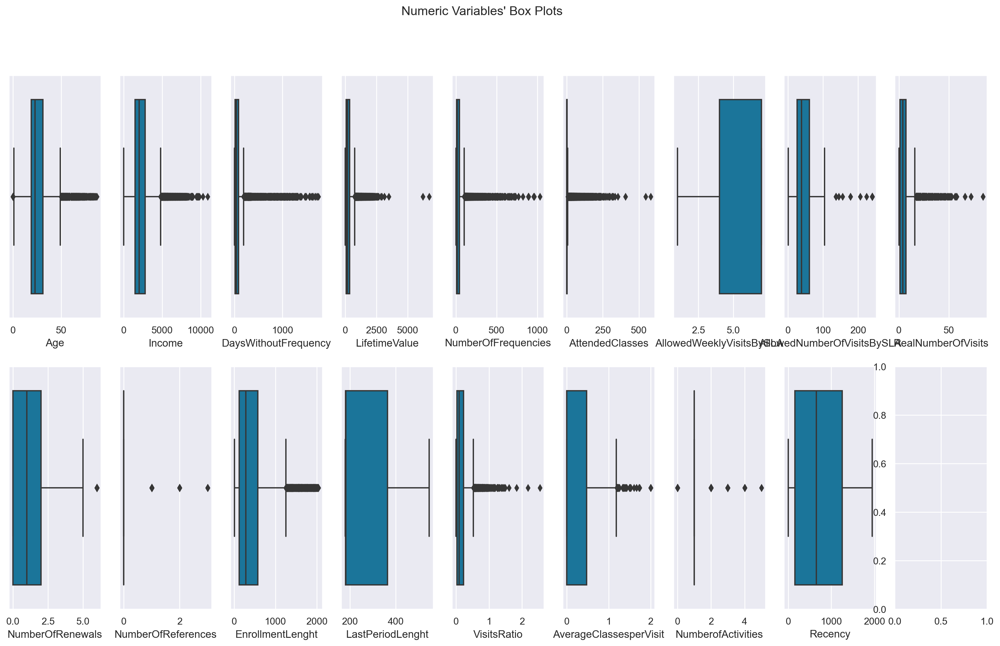

In [31]:
#Boxplot for metric
#All Numeric Variables' Box Plots in one figure
sns.set()

#Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

#Plot data
#Iterate across axes objects and associate each box plot 
for ax, feat in zip(axes.flatten(), metric_features): 
    sns.boxplot(x=dataset[feat], ax=ax,color='#067EAF')
    
#Layout
#Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)
plt.show()

#We can cleary identify some outliers present here

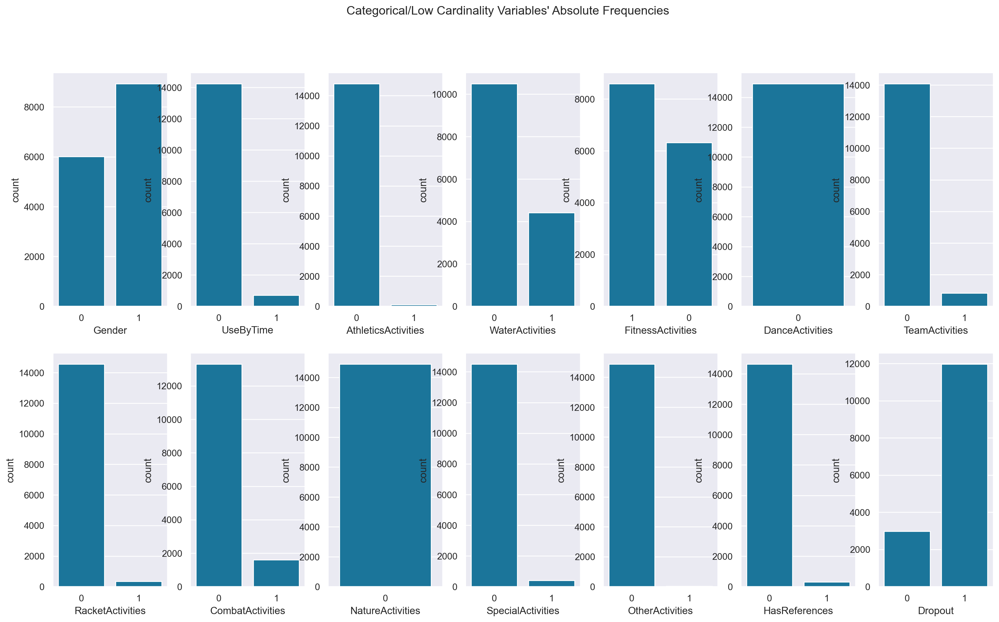

In [32]:
#Countplot for non metric
#All Non-Metric Variables' Absolute Frequencies
sns.set()

#Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(2, ceil(len(non_metric_features) / 2), figsize=(20, 11))

#Plot data
#Iterate across axes objects and associate each bar plot 
for ax, feat in zip(axes.flatten(), non_metric_features): 
    sns.countplot(x=dataset[feat].astype(object), ax=ax, color='#067EAF')

title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
plt.suptitle(title)
plt.show()

In [33]:
#Nature Activites and Dance Activites have no variance and on top of that no one is attending those classes.
#Assumption!: These are new activities and so they will not be useful for clustering- drop them

#Dropping the 2 activities
columnstodrop=["NatureActivities","DanceActivities"]

dataset.drop(columnstodrop,inplace=True,axis=1)

In [34]:
#Update on feature split
metric_features = ["Age", "Income", "DaysWithoutFrequency", "LifetimeValue", "NumberOfFrequencies","AttendedClasses","AllowedWeeklyVisitsBySLA","AllowedNumberOfVisitsBySLA","RealNumberOfVisits","NumberOfRenewals","NumberOfReferences","EnrollmentLenght","LastPeriodLenght","VisitsRatio", "AverageClassesperVisit", "NumberofActivities","Recency"]
non_metric_features = dataset.columns.drop(metric_features).to_list()

<a class="anchor" id="outliers">

## Outliers
###### [Go back to Contents](#top)
</a>

In [35]:
outliersdf=dataset.copy()

- Age we will not consider any value as outlier because it is representative of the demographics of the gym
- For Income it is also interesting to see different social status represented
- LifetimeValue we will cut it at the level of 5000
- NumberOfFrequencies at 750
- AllowedNumberOfVisitsBySLA at 200
- AttendedClasses at 500
- RealNumberOfVisits at 80
- VisitsRatio at 2
- AverageClassesperVisit at 2
- The remaining columns we assumed there were no Outliers to be taken out since they might provide useful insights on the clustering 

In [36]:

filters1 = (
    (outliersdf["LifetimeValue"]<=5000)
    &
    (outliersdf["NumberOfFrequencies"]<=750)
    &
     (outliersdf["AllowedNumberOfVisitsBySLA"]<200)
    &
    (outliersdf["AttendedClasses"]<500)
    &
    (outliersdf["RealNumberOfVisits"]<80)
     &
    (outliersdf["VisitsRatio"]<2)
    &
    (outliersdf["AverageClassesperVisit"]<2)
    
)
df_1 = outliersdf[filters1]
df_for_outliers=outliersdf[~filters1] #dataset for outliers to give them a cluster in the end

In [37]:
print('Percentage of data kept after removing outliers:', np.round(df_1.shape[0] / dataset.shape[0], 4))

Percentage of data kept after removing outliers: 0.9954


In [38]:
outliersdf=df_1.copy()

In [39]:
#NumberOfRenewals- impose a limit of 5 on all observations- simplifies variable
nor = outliersdf['NumberOfRenewals'].copy()
nor.loc[nor>5] = 5

outliersdf['NumberOfRenewals']= nor
outliersdf['NumberOfRenewals'].unique()

array([0, 2, 3, 5, 1, 4], dtype=int64)

In [40]:
dataset=outliersdf.copy()

We will not consider non metric features to have outliers for now

Visualizations after Outliers

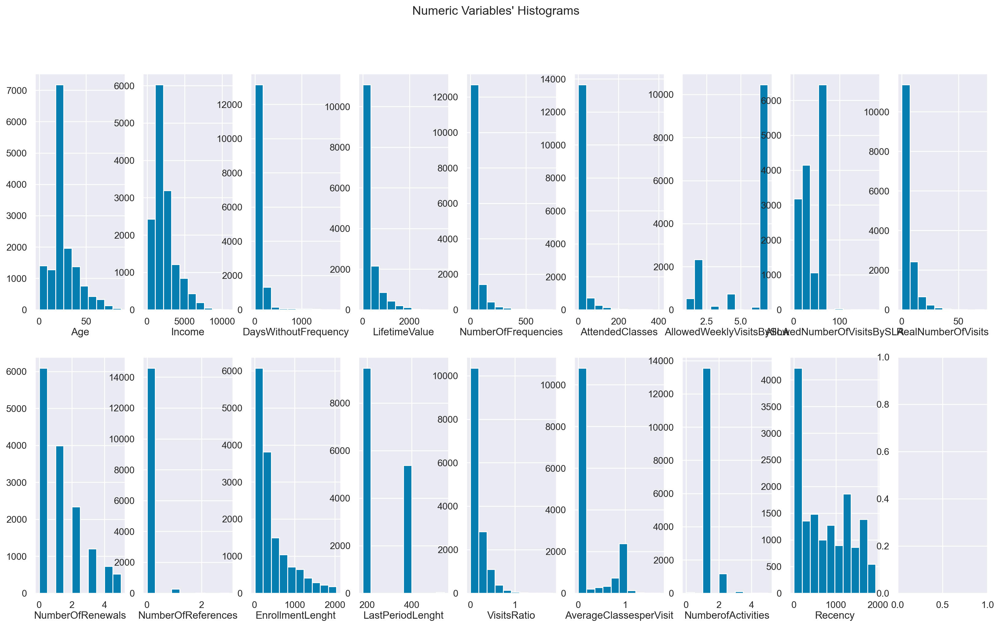

In [41]:
#HISTOGRAMS

#All Numeric Variables' Histograms in one figure
sns.set()

#Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

#Plot data
#Iterate across axes objects and associate each histogram 
for ax, feat in zip(axes.flatten(), metric_features): 
    ax.hist(dataset[feat],color='#067EAF')
    ax.set_title(feat, y=-0.13)
    
#Layout
#Add a centered title to the figure:
title = "Numeric Variables' Histograms"

plt.suptitle(title)
plt.show()

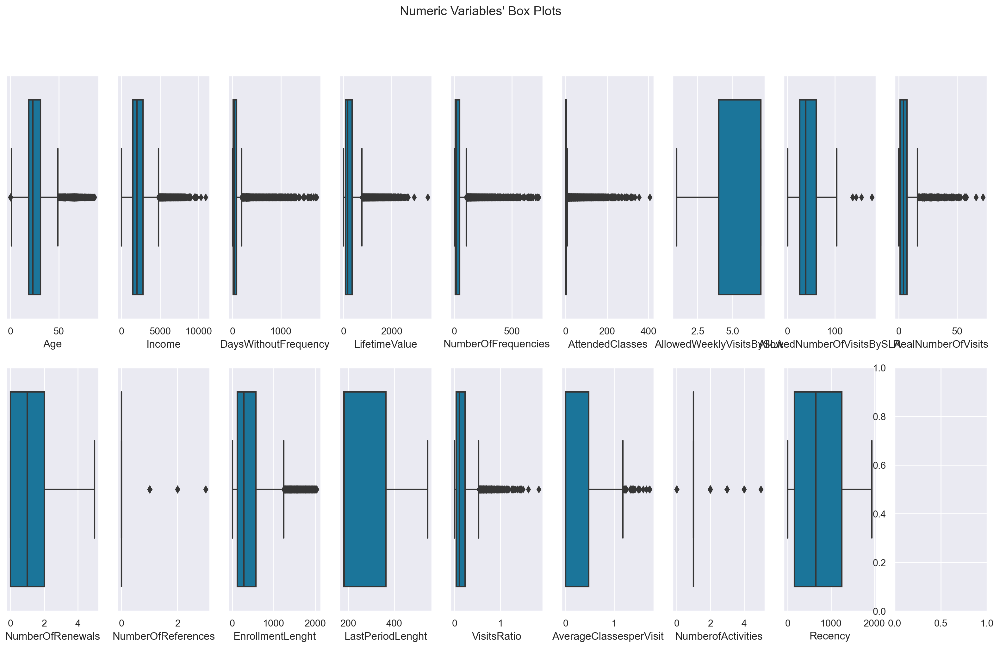

In [42]:
#boxplot for metric
#All Numeric Variables' Box Plots in one figure
sns.set()

#Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

#Plot data
#Iterate across axes objects and associate each box plot 
for ax, feat in zip(axes.flatten(), metric_features): 
    sns.boxplot(x=dataset[feat], ax=ax,color='#067EAF')
    
#Layout
#Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)
plt.show()

<a class="anchor" id="norma">

## Metric Features Normalization
###### [Go back to Contents](#top)
</a>

It is a good practice to normalize metric features since many clustering algorithms use distances as their basis. This way with the data normalized we can compare the differences in a proper way.

In [43]:
df_minmax=dataset.copy()

In [44]:
#Decision: use MinMax for now 
scaler = MinMaxScaler()
scaled_feat = scaler.fit_transform(df_minmax[metric_features])
scaled_feat
df_minmax[metric_features] = scaled_feat
df_minmax.head()

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,EnrollmentLenght,LastPeriodLenght,Recency,NumberofActivities,VisitsRatio,AverageClassesperVisit
ID,,,,,,,,,,,,,,,,,,,,,
10000,0.689655,1,0.505051,0.000573,0.025540,0,0,0,1,0,...,0.0,0,0.0,0,0.024631,0.008197,0.000514,0.2,0.173368,0.447489
10001,0.333333,1,0.241506,0.034384,0.136977,0,0,0,0,0,...,0.4,0,0.0,1,0.192118,0.502732,0.805755,0.2,0.031250,0.025015
10002,0.264368,0,0.181818,0.004011,0.010748,0,0,0,1,0,...,0.0,0,0.0,1,0.010837,0.000000,0.456835,0.2,0.108766,0.000000
10003,0.103448,0,0.000000,0.012607,0.044420,0,0,0,0,1,...,0.0,0,0.0,1,0.074877,0.502732,0.145427,0.2,0.092163,0.057534
10004,0.402299,0,0.396694,0.120344,0.106677,0,0,0,1,0,...,0.6,0,0.0,1,0.379310,0.000000,0.370504,0.2,0.000000,0.000000


<a class="anchor" id="missing">

## Missing Values
###### [Go back to Contents](#top)
</a>

### Missing Values Numeric with KNN

In [45]:
imputer = KNNImputer(n_neighbors=5, weights="uniform")
df_minmax[metric_features] = imputer.fit_transform(df_minmax[metric_features])

In [46]:
dataset=df_minmax.copy()

In [47]:
dataset[metric_features].isna().sum() #No more missing values in metric

Age                           0
Income                        0
DaysWithoutFrequency          0
LifetimeValue                 0
NumberOfFrequencies           0
AttendedClasses               0
AllowedWeeklyVisitsBySLA      0
AllowedNumberOfVisitsBySLA    0
RealNumberOfVisits            0
NumberOfRenewals              0
NumberOfReferences            0
EnrollmentLenght              0
LastPeriodLenght              0
VisitsRatio                   0
AverageClassesperVisit        0
NumberofActivities            0
Recency                       0
dtype: int64

### Missing Values Non-Metirc with Mode


In [48]:
modes = dataset[non_metric_features].mode().loc[0]
modes

Gender                 1
UseByTime              0
AthleticsActivities    0
WaterActivities        0
FitnessActivities      1
TeamActivities         0
RacketActivities       0
CombatActivities       0
SpecialActivities      0
OtherActivities        0
HasReferences          0
Dropout                1
Name: 0, dtype: Int64

In [49]:
dataset.fillna(modes, inplace=True)

In [50]:
dataset.isna().sum() #No more missing values in all variables

Age                           0
Gender                        0
Income                        0
DaysWithoutFrequency          0
LifetimeValue                 0
UseByTime                     0
AthleticsActivities           0
WaterActivities               0
FitnessActivities             0
TeamActivities                0
RacketActivities              0
CombatActivities              0
SpecialActivities             0
OtherActivities               0
NumberOfFrequencies           0
AttendedClasses               0
AllowedWeeklyVisitsBySLA      0
AllowedNumberOfVisitsBySLA    0
RealNumberOfVisits            0
NumberOfRenewals              0
HasReferences                 0
NumberOfReferences            0
Dropout                       0
EnrollmentLenght              0
LastPeriodLenght              0
Recency                       0
NumberofActivities            0
VisitsRatio                   0
AverageClassesperVisit        0
dtype: int64

<a class="anchor" id="treatout">

## Treatment for Outliers DF

###### [Go back to Contents](#top)
</a>

In [51]:
#scaling
scaler = MinMaxScaler()
scaled_feat = scaler.fit_transform(df_for_outliers[metric_features])
scaled_feat
df_for_outliers[metric_features] = scaled_feat
df_for_outliers.head()

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,EnrollmentLenght,LastPeriodLenght,Recency,NumberofActivities,VisitsRatio,AverageClassesperVisit
ID,,,,,,,,,,,,,,,,,,,,,
10262,0.265625,1,0.117886,0.078998,0.220792,0,0,1,0,0,...,0.8,1,1.0,1,0.748825,0.008197,0.050218,0.0,0.059244,0.492373
10409,0.281250,1,0.167683,0.000000,0.098626,0,0,1,0,0,...,0.6,0,0.0,0,0.610444,0.008197,0.000000,0.0,1.000000,0.329843
10680,0.703125,0,0.319106,0.000000,0.462081,0,0,1,0,0,...,1.0,0,0.0,0,0.984856,0.008197,0.000000,1.0,0.277644,0.005765
11158,0.375000,0,0.202236,0.204239,0.019252,0,0,1,0,0,...,0.2,0,0.0,1,0.080940,1.000000,0.879913,0.0,0.001640,0.000000
11265,0.000000,1,0.000000,0.009634,0.002412,0,0,1,0,0,...,0.0,0,0.0,0,0.008877,0.008197,0.002729,0.0,0.091765,1.000000


In [52]:
#missing values for numeric
imputer = KNNImputer(n_neighbors=5, weights="uniform")
df_for_outliers[metric_features] = imputer.fit_transform(df_for_outliers[metric_features])

In [53]:
#missing values for non_metric with mode
modes = df_for_outliers[non_metric_features].mode().loc[0]
modes
df_for_outliers.fillna(modes, inplace=True)

df_for_outliers.isna().sum()

Age                           0
Gender                        0
Income                        0
DaysWithoutFrequency          0
LifetimeValue                 0
UseByTime                     0
AthleticsActivities           0
WaterActivities               0
FitnessActivities             0
TeamActivities                0
RacketActivities              0
CombatActivities              0
SpecialActivities             0
OtherActivities               0
NumberOfFrequencies           0
AttendedClasses               0
AllowedWeeklyVisitsBySLA      0
AllowedNumberOfVisitsBySLA    0
RealNumberOfVisits            0
NumberOfRenewals              0
HasReferences                 0
NumberOfReferences            0
Dropout                       0
EnrollmentLenght              0
LastPeriodLenght              0
Recency                       0
NumberofActivities            0
VisitsRatio                   0
AverageClassesperVisit        0
dtype: int64

##### Checking for more outliers with DB SCAN

In [54]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.45, min_samples=34, n_jobs=4)
dbscan_labels = dbscan.fit_predict(dataset[metric_features])

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 3


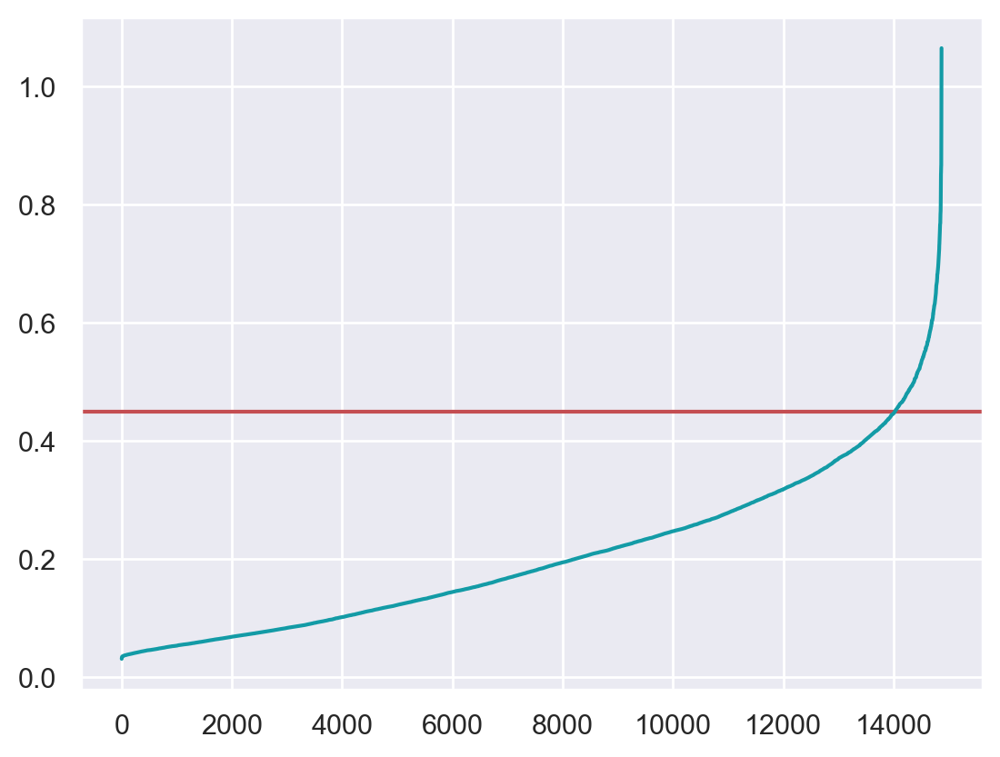

In [55]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(dataset[metric_features])
distances, _ = neigh.kneighbors(dataset[metric_features])
distances = np.sort(distances[:, -1])
plt.axhline(y=0.45, color='r', linestyle='-')
sns.set_style("white")
plt.plot(distances,color='#139ba6')
plt.show()

We choose 0.5 as our eps value where the "elbow" is located

In [56]:
# Concatenating the labels to df
df_concat = pd.concat([dataset, pd.Series(dbscan_labels, index=dataset.index, name="dbscan_labels")], axis=1)
df_concat.head()

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,HasReferences,NumberOfReferences,Dropout,EnrollmentLenght,LastPeriodLenght,Recency,NumberofActivities,VisitsRatio,AverageClassesperVisit,dbscan_labels
ID,,,,,,,,,,,,,,,,,,,,,
10000,0.689655,1,0.505051,0.000573,0.025540,0,0,0,1,0,...,0,0.0,0,0.024631,0.008197,0.000514,0.2,0.173368,0.447489,0
10001,0.333333,1,0.241506,0.034384,0.136977,0,0,0,0,0,...,0,0.0,1,0.192118,0.502732,0.805755,0.2,0.031250,0.025015,1
10002,0.264368,0,0.181818,0.004011,0.010748,0,0,0,1,0,...,0,0.0,1,0.010837,0.000000,0.456835,0.2,0.108766,0.000000,0
10003,0.103448,0,0.000000,0.012607,0.044420,0,0,0,0,1,...,0,0.0,1,0.074877,0.502732,0.145427,0.2,0.092163,0.057534,1
10004,0.402299,0,0.396694,0.120344,0.106677,0,0,0,1,0,...,0,0.0,1,0.379310,0.000000,0.370504,0.2,0.000000,0.000000,0


In [57]:
# Detecting noise (potential outliers)
more_outliers=df_concat.loc[df_concat['dbscan_labels'] == -1]
more_outliers

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,HasReferences,NumberOfReferences,Dropout,EnrollmentLenght,LastPeriodLenght,Recency,NumberofActivities,VisitsRatio,AverageClassesperVisit,dbscan_labels
ID,,,,,,,,,,,,,,,,,,,,,
10022,0.494253,1,0.306703,0.059026,0.100675,0,0,0,0,0,...,0,0.000000,1,0.166010,1.000000,0.826824,0.2,0.007938,0.575342,-1
10069,0.436782,0,0.439853,0.042407,0.253745,0,0,0,1,1,...,0,0.000000,1,0.639901,0.008197,0.272354,0.6,0.000000,0.543379,-1
10097,0.333333,0,0.173554,0.504871,0.224960,0,0,0,1,1,...,0,0.000000,1,0.527586,0.502732,0.687564,0.4,0.000000,0.575342,-1
10111,0.275862,0,0.206612,0.935817,0.009604,0,0,0,1,0,...,0,0.000000,0,0.026108,0.000000,0.839157,0.4,0.037569,0.000000,-1
10161,0.310345,1,0.185491,0.918625,0.031357,0,0,1,0,0,...,0,0.000000,1,0.805911,0.502732,0.942446,0.2,0.000000,0.402740,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24710,0.275862,0,0.237833,0.553009,0.219815,0,0,0,0,0,...,0,0.000000,1,0.595074,0.505464,0.623330,0.2,0.218750,0.547277,-1
24806,0.241379,1,0.109275,0.314040,0.041162,0,0,0,0,0,...,0,0.000000,1,0.283744,0.502732,0.985612,0.2,0.476593,0.517808,-1
24832,0.505747,1,0.369146,0.122636,0.258547,0,0,0,1,0,...,1,0.333333,1,0.547783,0.008197,0.303700,0.2,0.000000,0.445426,-1


DB SCAN Identified 347 rows as potential outliers

In [58]:
#adding these outliers to the outliers dataset
df_for_outliers=pd.concat([df_for_outliers,more_outliers])
df_for_outliers

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,HasReferences,NumberOfReferences,Dropout,EnrollmentLenght,LastPeriodLenght,Recency,NumberofActivities,VisitsRatio,AverageClassesperVisit,dbscan_labels
ID,,,,,,,,,,,,,,,,,,,,,
10262,0.265625,1,0.117886,0.078998,0.220792,0,0,1,0,0,...,1,1.000000,1,0.748825,0.008197,0.050218,0.0,0.059244,0.492373,NaN
10409,0.281250,1,0.167683,0.000000,0.098626,0,0,1,0,0,...,0,0.000000,0,0.610444,0.008197,0.000000,0.0,1.000000,0.329843,NaN
10680,0.703125,0,0.319106,0.000000,0.462081,0,0,1,0,0,...,0,0.000000,0,0.984856,0.008197,0.000000,1.0,0.277644,0.005765,NaN
11158,0.375000,0,0.202236,0.204239,0.019252,0,0,1,0,0,...,0,0.000000,1,0.080940,1.000000,0.879913,0.0,0.001640,0.000000,NaN
11265,0.000000,1,0.000000,0.009634,0.002412,0,0,1,0,0,...,0,0.000000,0,0.008877,0.008197,0.002729,0.0,0.091765,1.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24710,0.275862,0,0.237833,0.553009,0.219815,0,0,0,0,0,...,0,0.000000,1,0.595074,0.505464,0.623330,0.2,0.218750,0.547277,-1.0
24806,0.241379,1,0.109275,0.314040,0.041162,0,0,0,0,0,...,0,0.000000,1,0.283744,0.502732,0.985612,0.2,0.476593,0.517808,-1.0
24832,0.505747,1,0.369146,0.122636,0.258547,0,0,0,1,0,...,1,0.333333,1,0.547783,0.008197,0.303700,0.2,0.000000,0.445426,-1.0


In [59]:
#updating final dataset
df_filtered = df_concat[df_concat['dbscan_labels'] != -1]
df_filtered.drop('dbscan_labels', axis=1, inplace=True)

In [60]:
print('Percentage of data kept after removing outliers:', np.round(df_filtered.shape[0] / dataset.shape[0], 4))

Percentage of data kept after removing outliers: 0.9767


In [61]:
dataset=df_filtered.copy()

<a class="anchor" id="extra">

## Extra Visualizations

###### [Go back to Contents](#top)
</a>

In [62]:
#Pairwise Relationship of Numerical Variables
#sns.set()

#Setting pairplot
#sns.pairplot(dataset[metric_features], diag_kind="hist",palette='BrBG')

#Layout
#plt.subplots_adjust(top=0.95)
#plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20) 


In [63]:
#Pairwise Relationship of Numerical Variables
#sns.set()

#Setting pairplot
#sns.pairplot(dataset[metric_features + ['Dropout']], diag_kind="hist",hue='Dropout')

#Layout
#plt.subplots_adjust(top=0.95)
#plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20) 

<a class="anchor" id="sele">

## Feature Selection
###### [Go back to Contents](#top)
</a>

We will use the correlation matrix to help us understand wich features might be redundant so we don´t use them together when doing the clusters

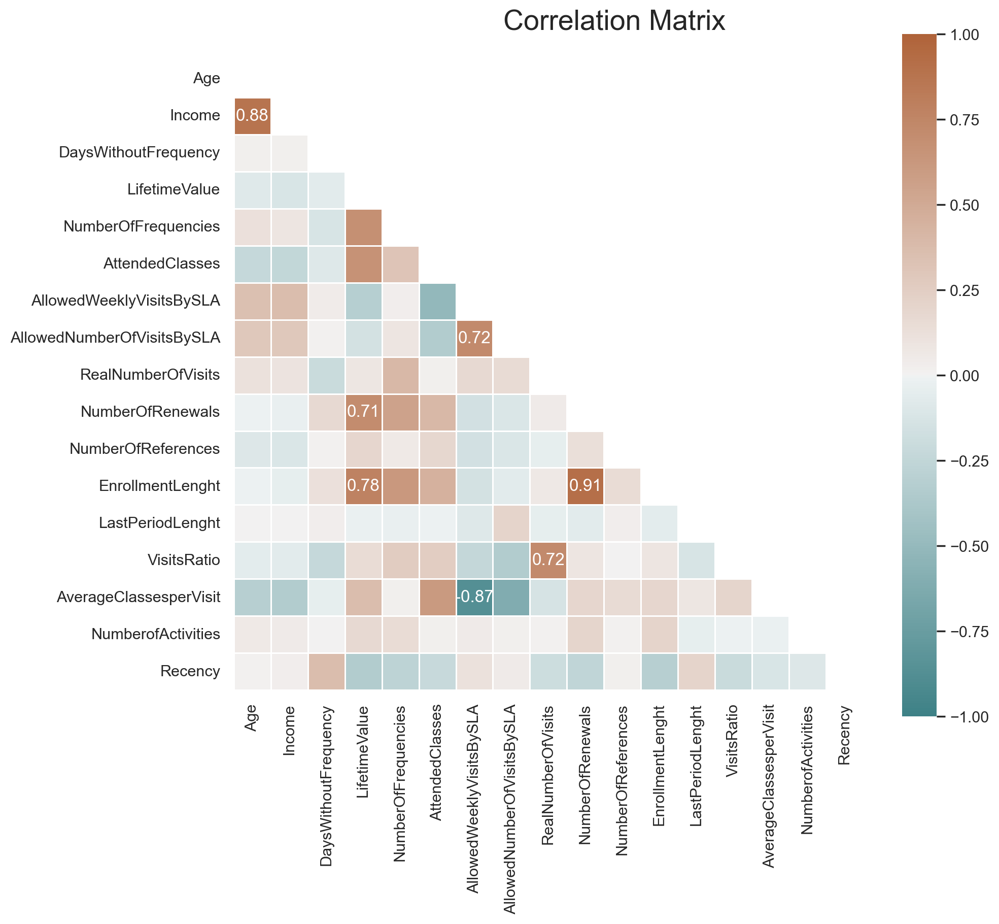

In [60]:
#Prepare figure
sns.set_theme(style="white")
fig = plt.figure(figsize=(10, 8))


corr = np.round(dataset[metric_features].corr(method="pearson"), decimals=2)

#Build annotation matrix (values above |0.7| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.7
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) 

matrix = np.triu(corr)
mask = np.triu(np.ones_like(corr, dtype=bool))

#Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot,mask=mask, cmap=sns.diverging_palette(200, 30, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

#Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)


plt.show()

We will use a treshold of 0.7
- Age and Income have 0.88 correlation
- Lifetime Value and Number of renewals have 0.71
- Lifetime Value and Enrollment Lenght have 0.79
- AllowedNumberofVisits and AllowedWeekly have 0.71
- Average Class per visit and allowed weekly visits have -0.86   DROP ALLOWED WEEKLY- THEY HAD MANY NANS as well
- Visits Ratio and RealNumberofVisits have 0.72
- EnrollmentLenght and Number of renewals have 0.91

<a class="anchor" id="c1">

## Clustering Method 1: Based on Value
###### [Go back to Contents](#top)
</a>

1. Clustering for Customer Value:
2. Variables:
  - LifetimeValue
  - NumberOfFrequencies
  - NumberofRenewals
  - EnrollmentLenght
  - VisitsRatio
  - AverageClassesperVisit
3. Justification:
These variables capture aspects related to the customer's value, engagement, retention, and the ratio of visits, providing insights into their long-term relationship with the service.

In [60]:
selected_features=["LifetimeValue", "NumberOfFrequencies", "NumberOfRenewals", "VisitsRatio","AverageClassesperVisit","AttendedClasses"] #we took enrollment lenght because of correlation to other 2 variables

In [61]:
df_c1=dataset.loc[:,selected_features]

1st attempt: K-means

In [63]:
#Better initialization method and provide more n_init
kmclust = KMeans(n_clusters=8, 
                 init='k-means++', #this ensures that the initialized centroids are far from eachother, which is a better aproach
                 n_init=15,        
                 random_state=1)
kmclust.fit(df_c1)

KMeans(n_init=15, random_state=1)

In [64]:
kmclust.predict(df_c1) #Initial cluster prediction

array([0, 1, 2, ..., 2, 3, 4])

In [65]:
range_clusters = range(1, 11) #Defining range of clusters

In [66]:
#We will use inertia to understand the best number of clusters with elbow method
inertia = []
for n_clus in range_clusters:  #Iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_c1)
    inertia.append(kmclust.inertia_)  #Save the inertia of the given cluster solution

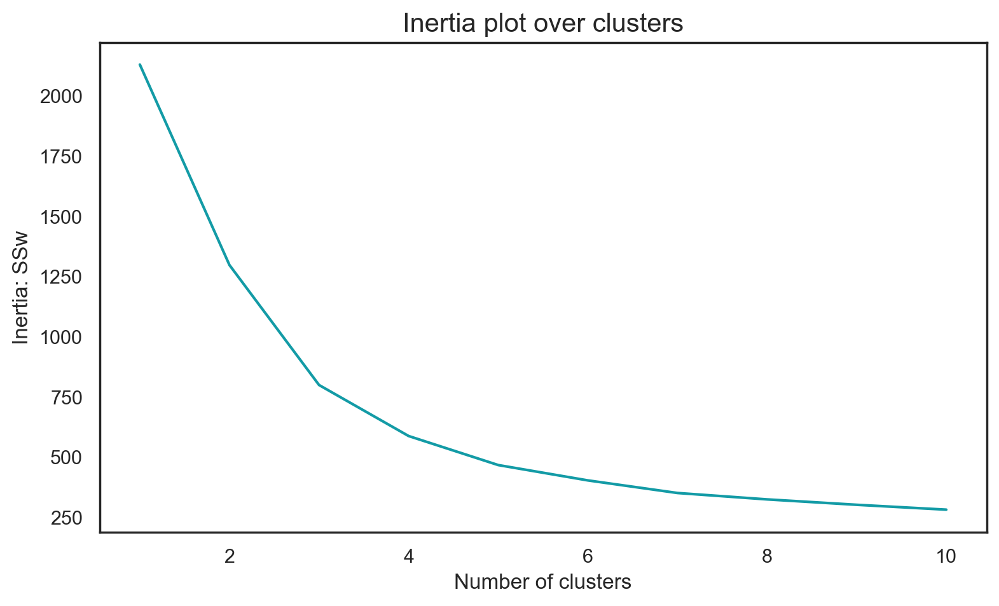

In [67]:
#The inertia plot
sns.set_style("white")
plt.figure(figsize=(9,5))
plt.plot(range_clusters, inertia,color='#139ba6')
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

For n_clusters = 2, the average silhouette_score is : 0.43444851781156324
For n_clusters = 3, the average silhouette_score is : 0.5312963675841725
For n_clusters = 4, the average silhouette_score is : 0.5348171573645619
For n_clusters = 5, the average silhouette_score is : 0.48200771247914076
For n_clusters = 6, the average silhouette_score is : 0.4756000686933316
For n_clusters = 7, the average silhouette_score is : 0.4683152733424465
For n_clusters = 8, the average silhouette_score is : 0.4736629800415577
For n_clusters = 9, the average silhouette_score is : 0.46365723212658927
For n_clusters = 10, the average silhouette_score is : 0.46876257893297163


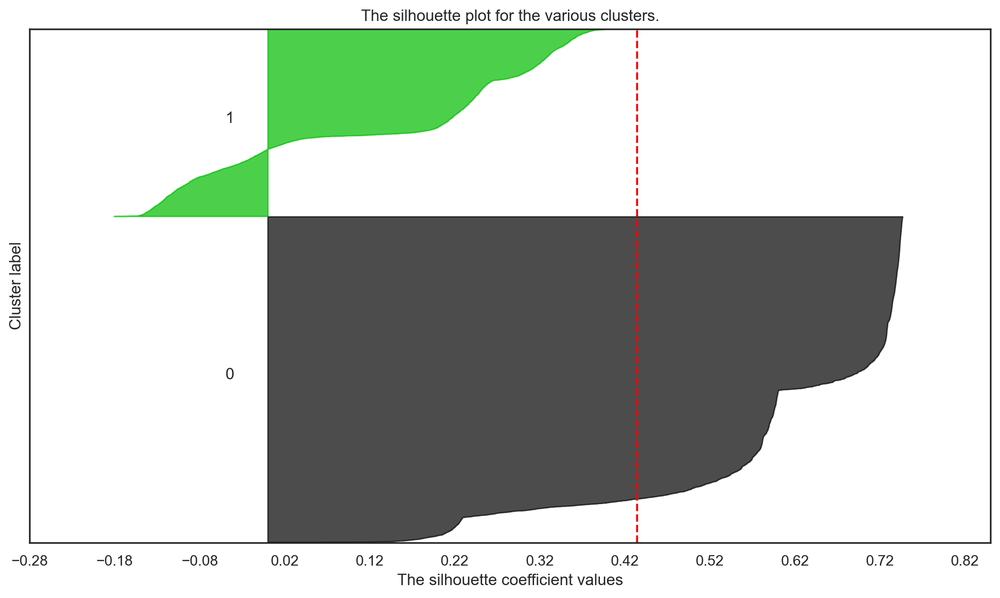

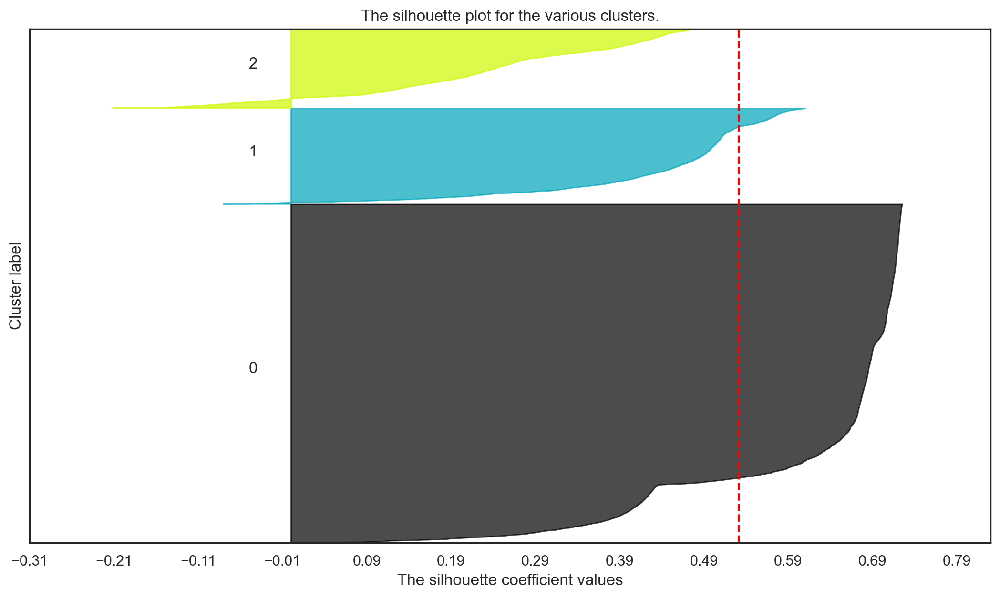

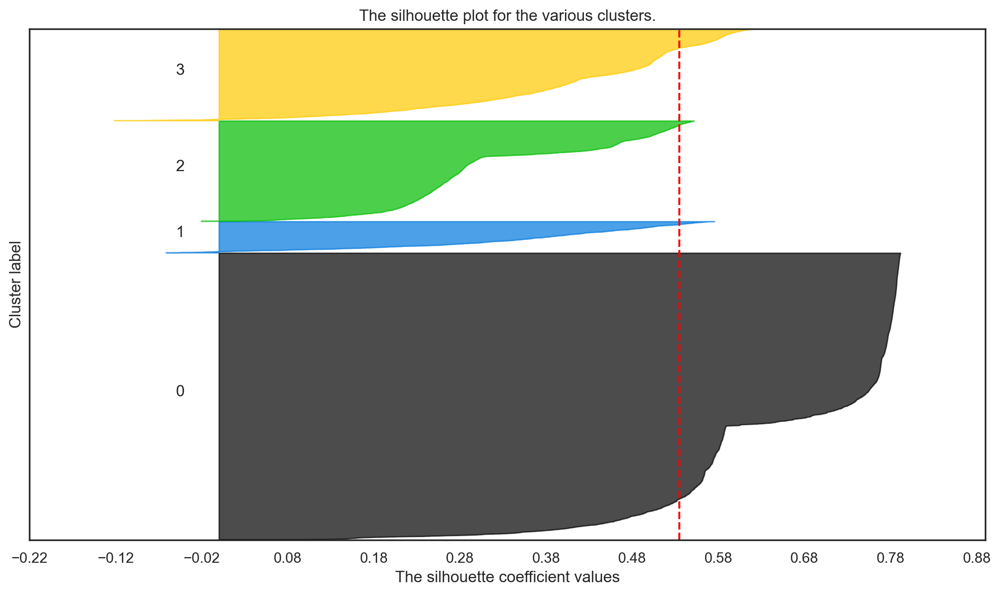

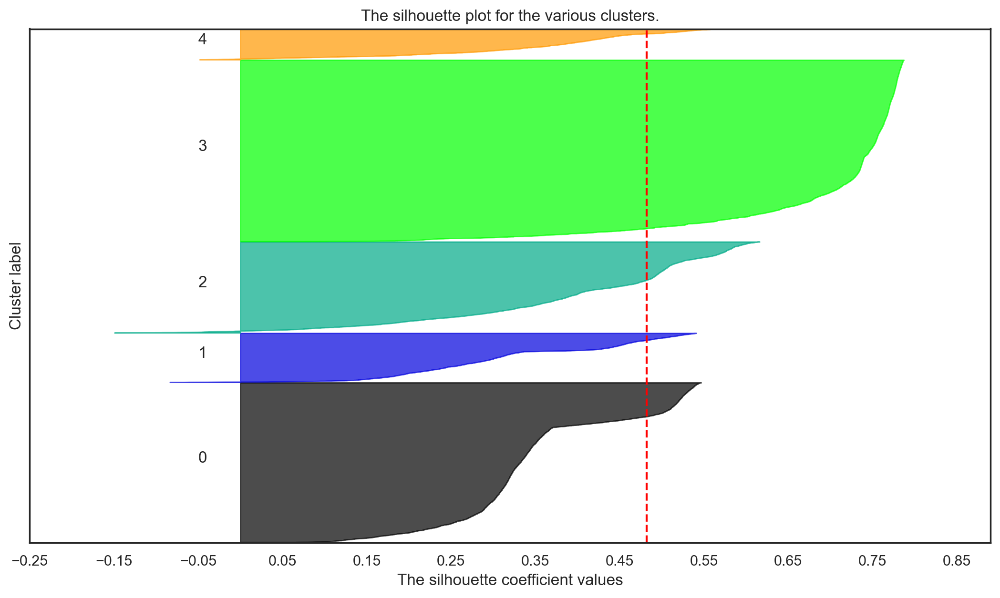

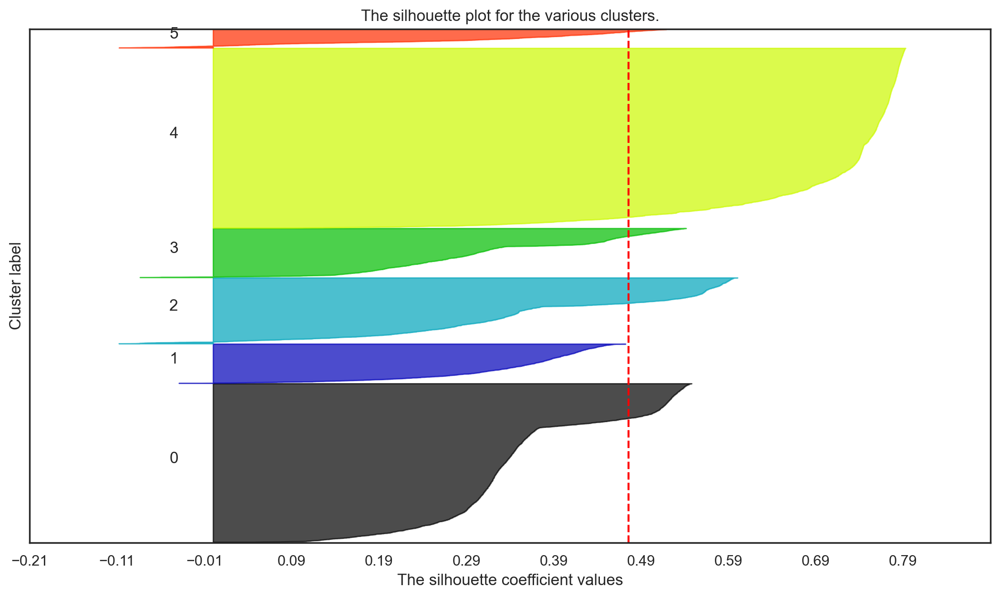

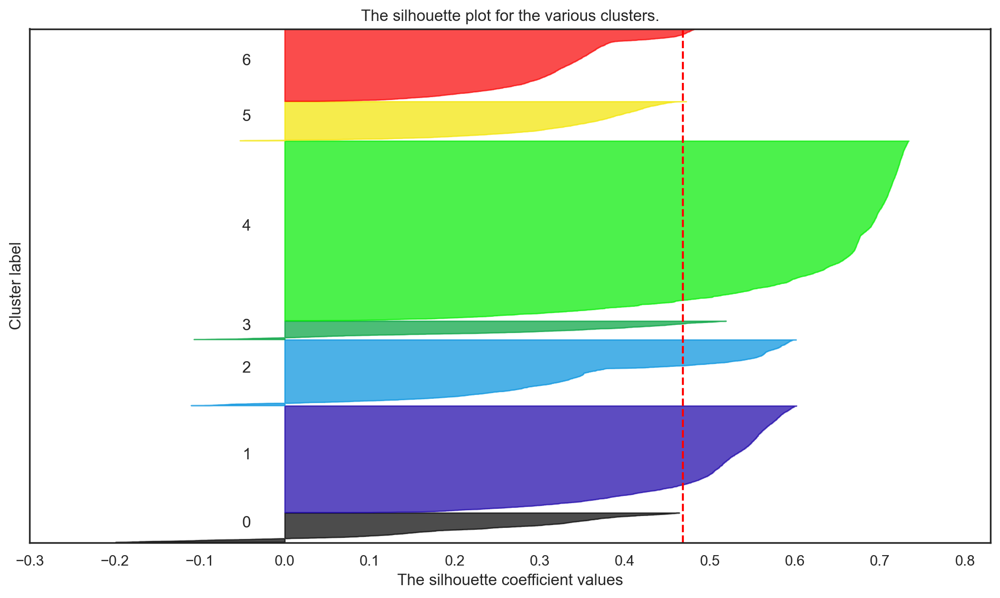

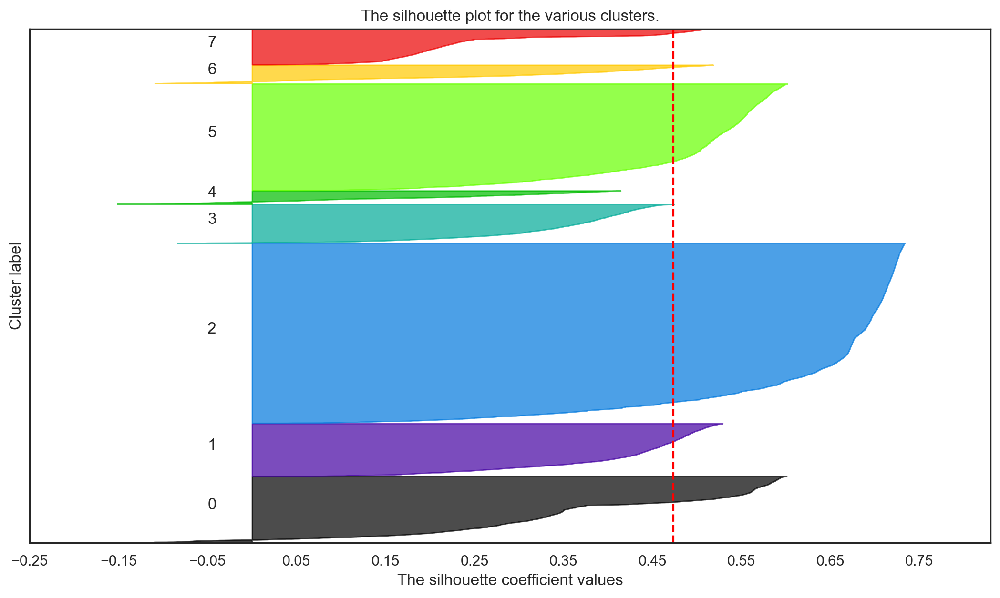

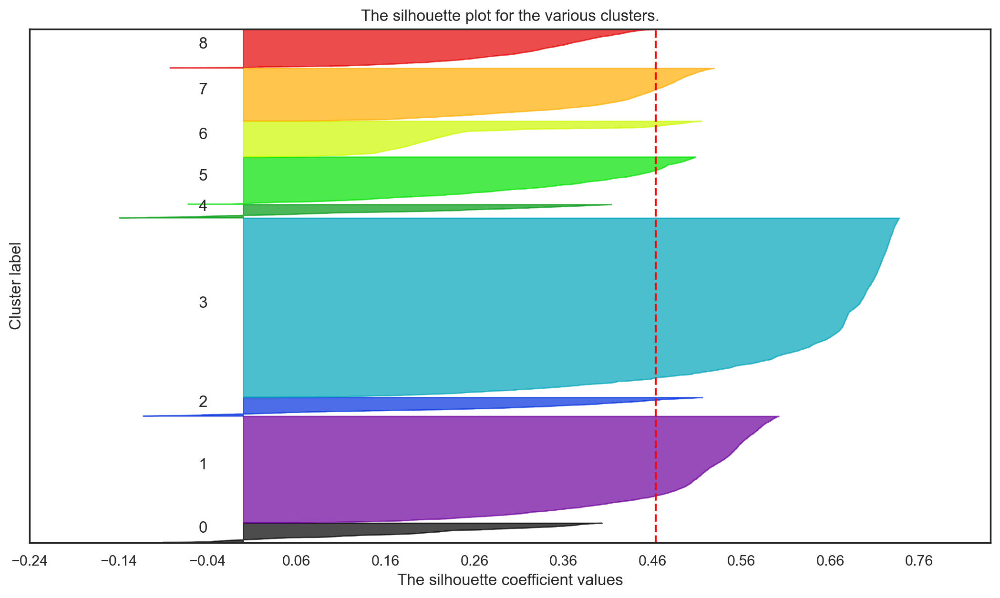

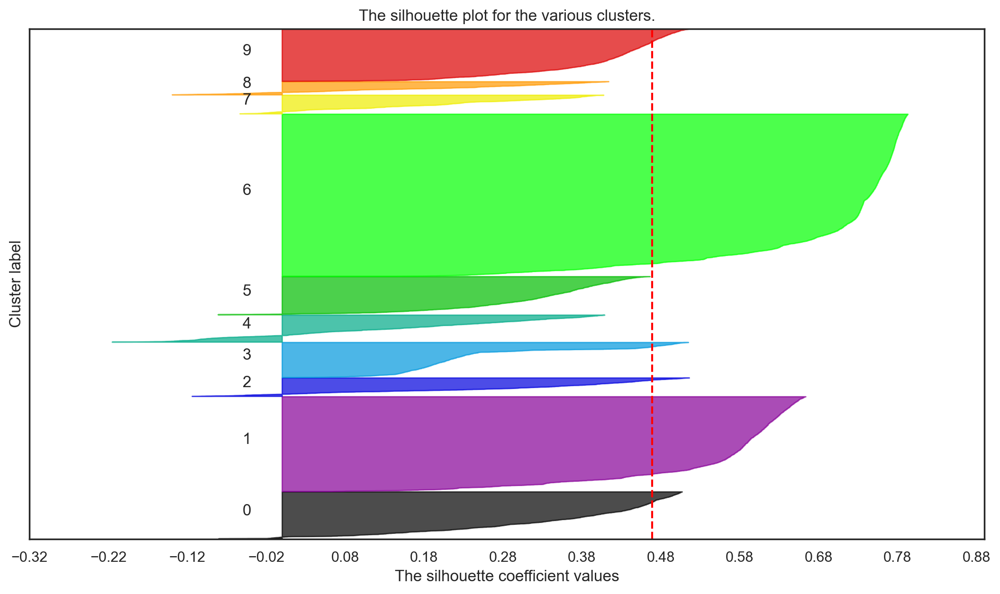

In [68]:
#Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    #Skip nclus == 1
    if nclus == 1:
        continue
    
    #Create a figure
    fig = plt.figure(figsize=(13, 7))

    #Initialize the KMeans object with n_clusters value and a random generator
    #seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_c1)

    #The silhouette_score gives the average value for all the samples.
    #This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_c1, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    #Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_c1, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        #Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        #Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        #Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        #Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        #Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")
    #The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    #The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    #The (nclus+1)*10 is for inserting blank space between silhouette
    #plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_c1) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))



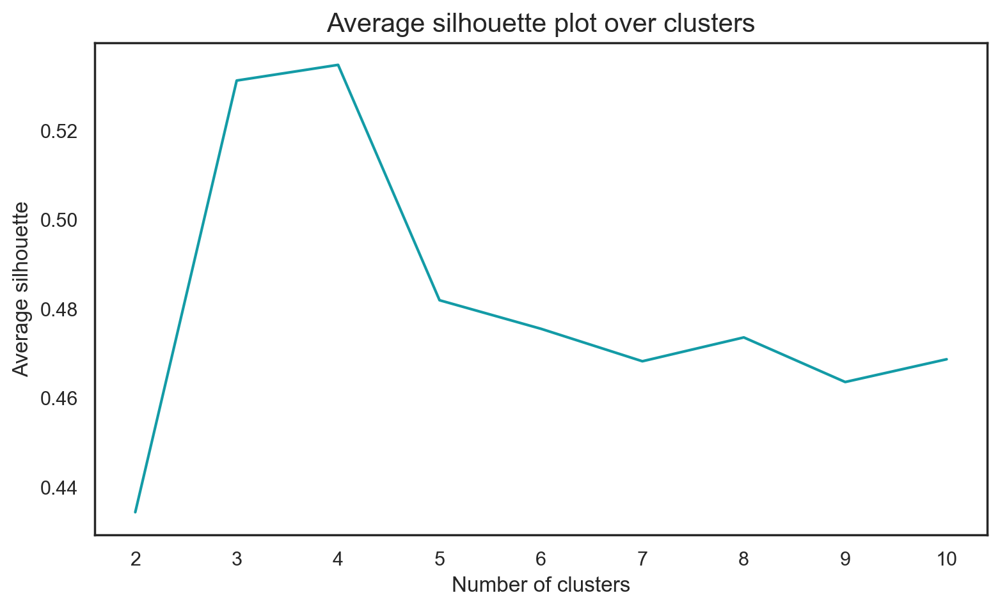

In [69]:
#The average silhouette plot
sns.set_style("white")
plt.figure(figsize=(9,5))
plt.plot(range_clusters[1:], ## Plot X-axis; Why range_clusters[1:] ? Because we skipped k=1 in the cell above
         avg_silhouette,color='#139ba6')     ## Plot Y-axis

plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

We will go on with 4 clusters

In [351]:
#Final cluster solution
number_clusters = 4
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(df_c1)
km_labels

array([3, 2, 0, ..., 0, 1, 2])

In [352]:
#Characterizing the final clusters
df_concat = pd.concat((dataset[selected_features], pd.Series(km_labels, name='value_labels', index=dataset.index)), axis=1)

In [353]:
df_final1=df_concat.groupby('value_labels').mean()
df_final1

,LifetimeValue,NumberOfFrequencies,NumberOfRenewals,VisitsRatio,AverageClassesperVisit,AttendedClasses
value_labels,,,,,,
0,0.038021,0.026745,0.073953,0.071726,0.005988,0.000465
1,0.314123,0.124481,0.741667,0.130903,0.497063,0.189128
2,0.126903,0.110499,0.551765,0.075276,0.010583,0.002592
3,0.092856,0.031359,0.186723,0.114765,0.519856,0.052579


In [65]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_concat[selected_features])  # get total sum of squares
ssw_labels = df_concat[selected_features + ["value_labels"]].groupby(by='value_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.723955954164064

2nd attempt: SOM

In [428]:
#SOMPY imports here due to some visualization problems before
import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView
from sklearn.base import clone

In [429]:
np.random.seed(42)

# Notice that the SOM did not converge - We're under a time constraint
sm = sompy.SOMFactory().build(
    df_c1.values, 
    mapsize=[50, 50],  # NEEDS TO BE A LIST
    initialization='random',
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=selected_features
)

## This will take a few minutes!
sm.train(n_job=-1, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 random_initialization took: 0.001000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 100

 epoch: 1 ---> elapsed time:  0.675000, quantization error: 2.069039

 epoch: 2 ---> elapsed time:  0.651000, quantization error: 2.025794

 epoch: 3 ---> elapsed time:  0.637000, quantization error: 2.005489

 epoch: 4 ---> elapsed time:  0.583000, quantization error: 1.991257

 epoch: 5 ---> elapsed time:  0.616000, quantization error: 1.985117

 epoch: 6 ---> elapsed time:  0.605000, quantization error: 1.971147

 epoch: 7 ---> elapsed time:  0.572000, quantization error: 1.966558

 epoch: 8 ---> elapsed time:  0.592000, quantization error: 1.964817

 epoch: 9 ---> elapsed time:  0.583000, quantization error: 1.963394

 epoch: 10 ---> elapsed time:  0.626000, quantization error: 1.961970

 epoch: 11 ---> elapsed time:  0.619000, quantization error: 1.960515

 epoch: 12 ---> elapsed time:  0.719000, quantization error: 1.959028

 epoch: 13 --->

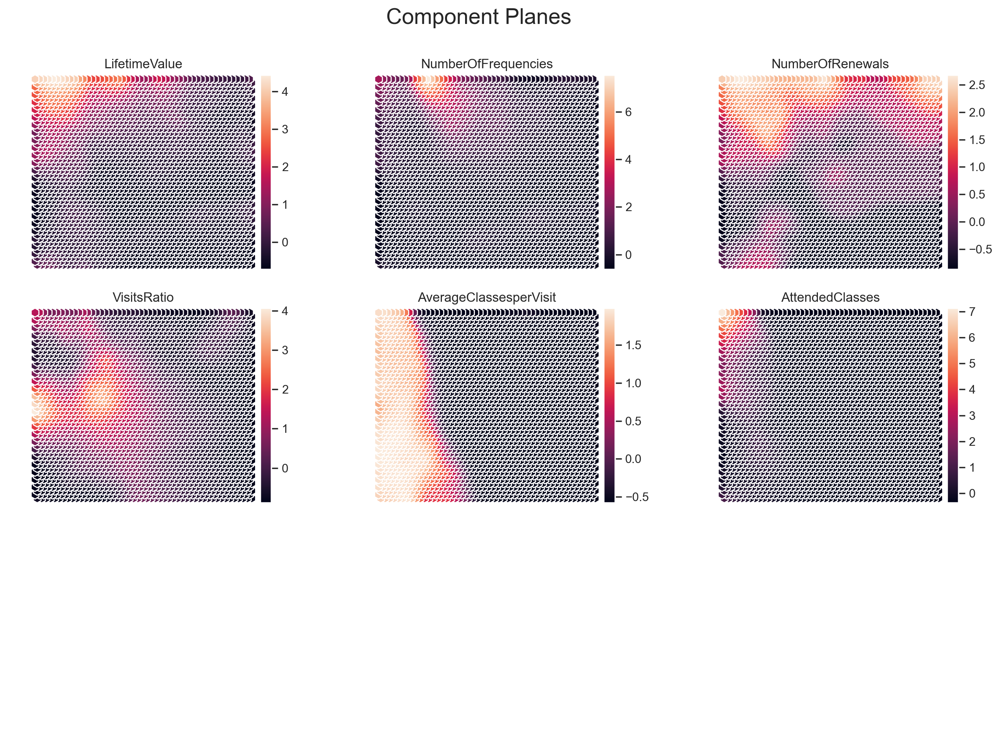

In [430]:
# Component planes on the 50x50 grid
sns.set()
view2D = View2D(12,12,"", text_size=10)
view2D.show(sm, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

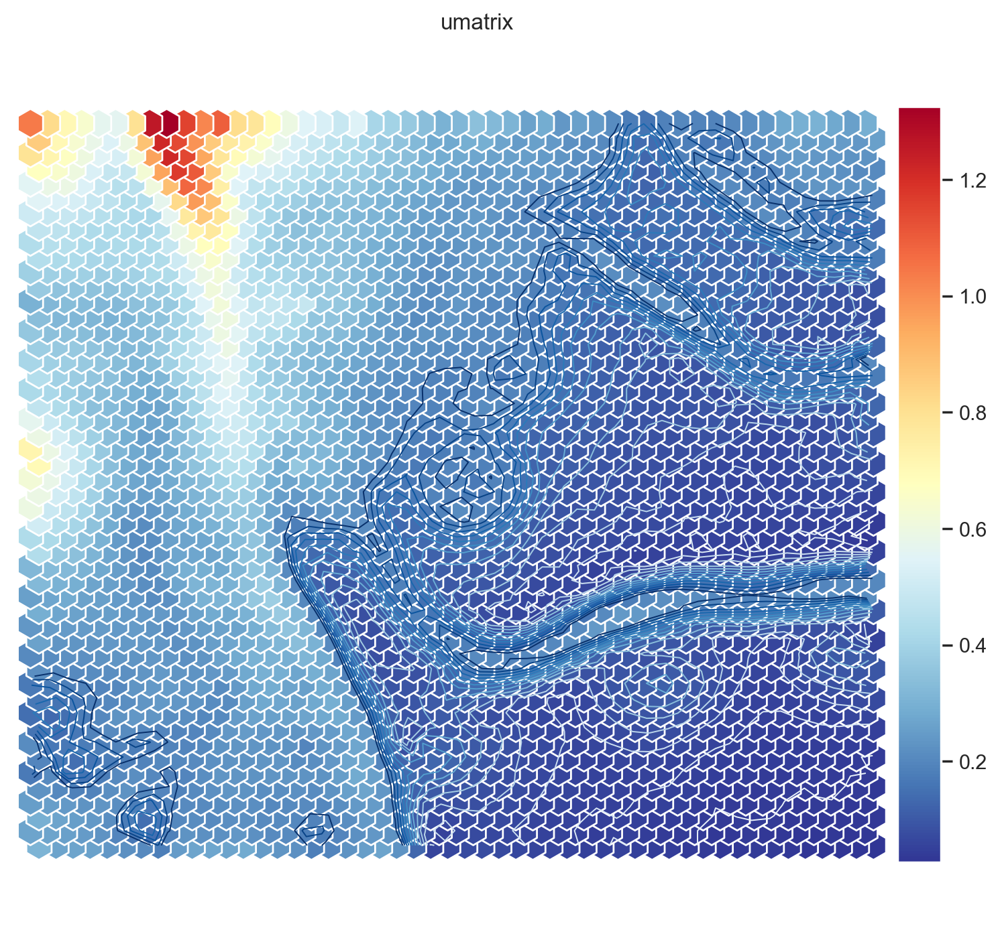

In [431]:
# U-matrix of the 50x50 grid
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2, 
    row_normalized=False, 
    show_data=False, 
    contour=True # Visualize isomorphic curves
)

In [432]:
range_clusters = range(1, 11) #Defining range of clusters
#We will use inertia to understand the best number of clusters with elbow method
inertia = []
for n_clus in range_clusters:  #Iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_c1)
    inertia.append(kmclust.inertia_)  #Save the inertia of the given cluster solution

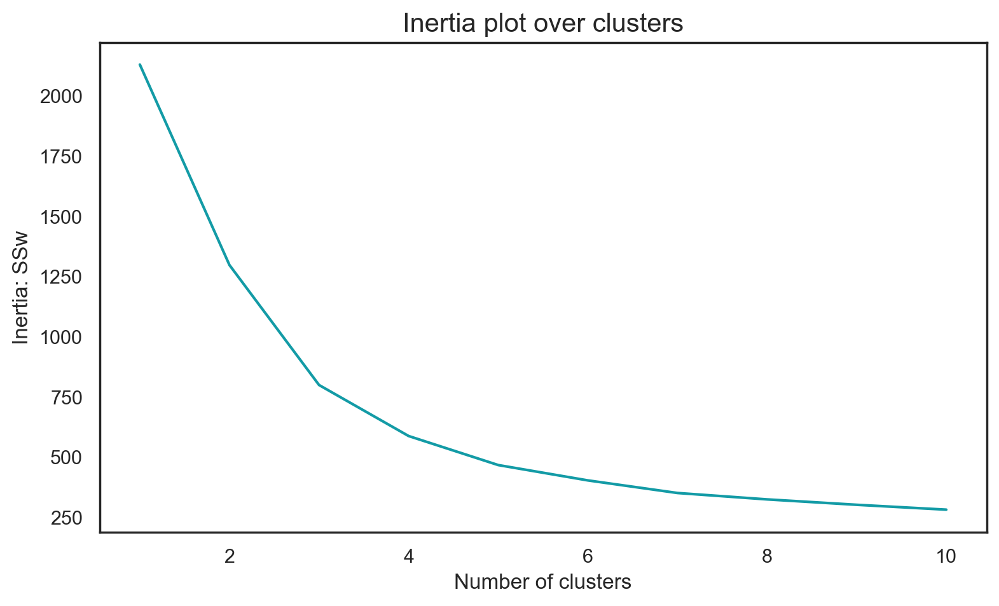

In [433]:
#The inertia plot
sns.set_style("white")
plt.figure(figsize=(9,5))
plt.plot(range_clusters, inertia, color='#139ba6')
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

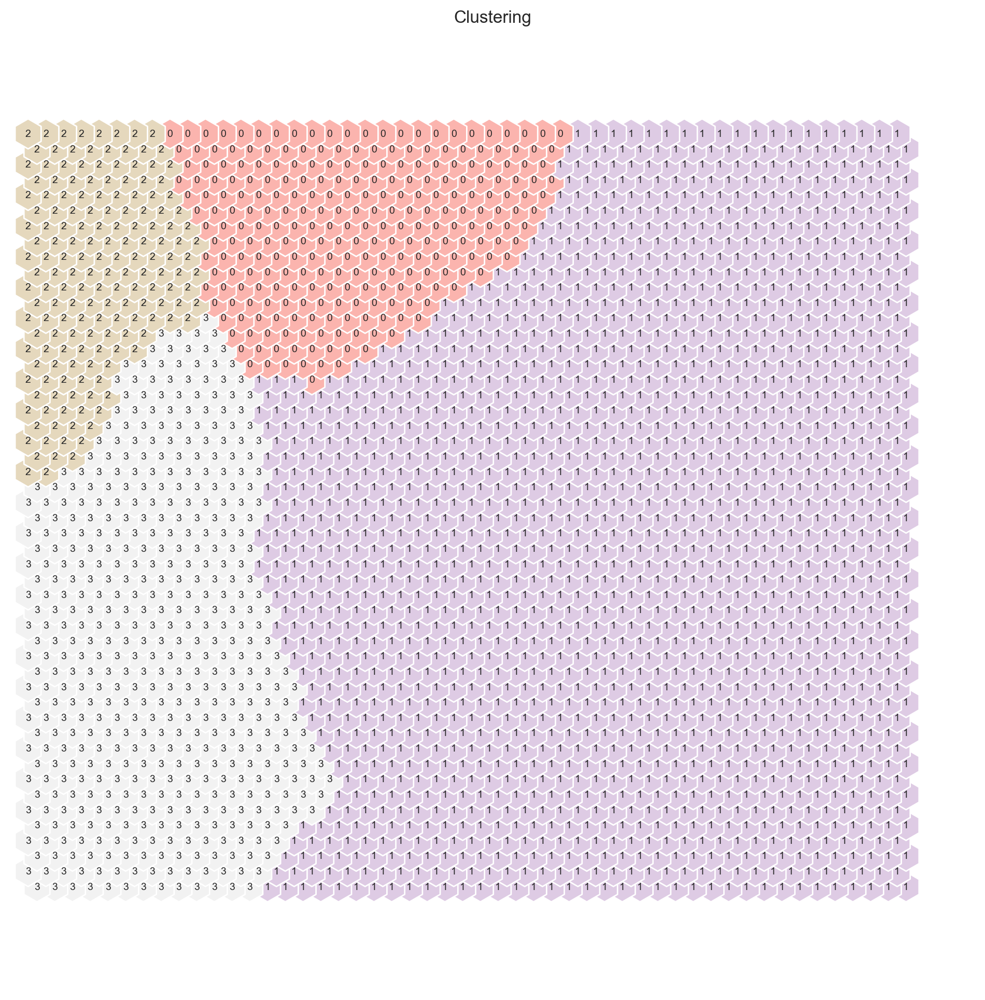

In [434]:
# Perform K-Means clustering on top of the units (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [435]:
# Check the nodes and and respective clusters
nodes = sm.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=selected_features)
df_nodes['label'] = nodeclus_labels
df_nodes

,LifetimeValue,NumberOfFrequencies,NumberOfRenewals,VisitsRatio,AverageClassesperVisit,AttendedClasses,label
0,0.357579,0.031716,2.427881,-0.627720,-0.541260,-0.346703,1
1,0.189376,0.039890,2.411254,-0.420763,-0.548503,-0.348565,1
2,0.033239,0.052966,2.443217,-0.132633,-0.556249,-0.350206,1
3,-0.046189,0.108383,2.433723,0.182933,-0.562311,-0.350928,1
4,0.010701,0.250631,2.164994,0.254273,-0.557064,-0.344101,1
...,...,...,...,...,...,...,...
2495,0.486083,-0.344227,0.666402,-0.798702,1.891133,0.330723,3
2496,0.680583,-0.286623,0.513524,-0.769125,1.853770,0.443287,3
2497,0.642349,-0.186710,0.326655,-0.715191,1.806874,0.641545,3
2498,0.647490,-0.106417,0.086493,-0.694898,1.770357,0.795743,3


In [436]:
# Obtaining SOM's BMUs labels
bmus_map = sm.find_bmu(df_c1)[0]  # get bmus for each observation in df
print(bmus_map)
df_bmus = pd.DataFrame(
    np.concatenate((dataset, np.expand_dims(bmus_map,1)), axis=1),
    index=dataset.index, columns=np.append(dataset.columns,"BMU")
)
df_bmus

[1984.  361. 1068. ... 1068. 1935.  411.]


,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,HasReferences,NumberOfReferences,Dropout,EnrollmentLenght,LastPeriodLenght,Recency,NumberofActivities,VisitsRatio,AverageClassesperVisit,BMU
ID,,,,,,,,,,,,,,,,,,,,,
10000,0.689655,1,0.505051,0.000573,0.02554,0,0,0,1,0,...,0,0.0,0,0.024631,0.008197,0.000514,0.2,0.173368,0.447489,1984.0
10001,0.333333,1,0.241506,0.034384,0.136977,0,0,0,0,0,...,0,0.0,1,0.192118,0.502732,0.805755,0.2,0.03125,0.025015,361.0
10002,0.264368,0,0.181818,0.004011,0.010748,0,0,0,1,0,...,0,0.0,1,0.010837,0.0,0.456835,0.2,0.108766,0.0,1068.0
10003,0.103448,0,0.0,0.012607,0.04442,0,0,0,0,1,...,0,0.0,1,0.074877,0.502732,0.145427,0.2,0.092163,0.057534,968.0
10004,0.402299,0,0.396694,0.120344,0.106677,0,0,0,1,0,...,0,0.0,1,0.37931,0.0,0.370504,0.2,0.0,0.0,361.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24937,0.16092,0,0.0,0.001146,0.417462,0,0,1,0,0,...,0,0.0,0,0.591626,0.008197,0.001028,0.2,0.125,0.493151,2489.0
24938,0.448276,0,0.359596,0.021777,0.098288,0,0,0,0,0,...,0,0.0,1,0.124631,0.002732,0.658787,0.2,0.026786,0.0,917.0
24939,0.229885,0,0.166208,0.001146,0.012463,0,0,0,1,0,...,0,0.0,1,0.010837,0.0,0.486125,0.2,0.145022,0.0,1068.0


In [437]:
# Get cluster labels for each observation
df_final = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)
df_final

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,NumberOfReferences,Dropout,EnrollmentLenght,LastPeriodLenght,Recency,NumberofActivities,VisitsRatio,AverageClassesperVisit,BMU,label
ID,,,,,,,,,,,,,,,,,,,,,
10000,0.689655,1,0.505051,0.000573,0.02554,0,0,0,1,0,...,0.0,0,0.024631,0.008197,0.000514,0.2,0.173368,0.447489,1984.0,3
10001,0.333333,1,0.241506,0.034384,0.136977,0,0,0,0,0,...,0.0,1,0.192118,0.502732,0.805755,0.2,0.03125,0.025015,361.0,1
10002,0.264368,0,0.181818,0.004011,0.010748,0,0,0,1,0,...,0.0,1,0.010837,0.0,0.456835,0.2,0.108766,0.0,1068.0,1
10003,0.103448,0,0.0,0.012607,0.04442,0,0,0,0,1,...,0.0,1,0.074877,0.502732,0.145427,0.2,0.092163,0.057534,968.0,1
10004,0.402299,0,0.396694,0.120344,0.106677,0,0,0,1,0,...,0.0,1,0.37931,0.0,0.370504,0.2,0.0,0.0,361.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24937,0.16092,0,0.0,0.001146,0.417462,0,0,1,0,0,...,0.0,0,0.591626,0.008197,0.001028,0.2,0.125,0.493151,2489.0,3
24938,0.448276,0,0.359596,0.021777,0.098288,0,0,0,0,0,...,0.0,1,0.124631,0.002732,0.658787,0.2,0.026786,0.0,917.0,1
24939,0.229885,0,0.166208,0.001146,0.012463,0,0,0,1,0,...,0.0,1,0.010837,0.0,0.486125,0.2,0.145022,0.0,1068.0,1


In [438]:
# Characterizing the final clusters
solution2=df_final.drop(columns='BMU')
solution2

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,HasReferences,NumberOfReferences,Dropout,EnrollmentLenght,LastPeriodLenght,Recency,NumberofActivities,VisitsRatio,AverageClassesperVisit,label
ID,,,,,,,,,,,,,,,,,,,,,
10000,0.689655,1,0.505051,0.000573,0.02554,0,0,0,1,0,...,0,0.0,0,0.024631,0.008197,0.000514,0.2,0.173368,0.447489,3
10001,0.333333,1,0.241506,0.034384,0.136977,0,0,0,0,0,...,0,0.0,1,0.192118,0.502732,0.805755,0.2,0.03125,0.025015,1
10002,0.264368,0,0.181818,0.004011,0.010748,0,0,0,1,0,...,0,0.0,1,0.010837,0.0,0.456835,0.2,0.108766,0.0,1
10003,0.103448,0,0.0,0.012607,0.04442,0,0,0,0,1,...,0,0.0,1,0.074877,0.502732,0.145427,0.2,0.092163,0.057534,1
10004,0.402299,0,0.396694,0.120344,0.106677,0,0,0,1,0,...,0,0.0,1,0.37931,0.0,0.370504,0.2,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24937,0.16092,0,0.0,0.001146,0.417462,0,0,1,0,0,...,0,0.0,0,0.591626,0.008197,0.001028,0.2,0.125,0.493151,3
24938,0.448276,0,0.359596,0.021777,0.098288,0,0,0,0,0,...,0,0.0,1,0.124631,0.002732,0.658787,0.2,0.026786,0.0,1
24939,0.229885,0,0.166208,0.001146,0.012463,0,0,0,1,0,...,0,0.0,1,0.010837,0.0,0.486125,0.2,0.145022,0.0,1


In [439]:
solution2.groupby('label').mean()

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,EnrollmentLenght,LastPeriodLenght,Recency,NumberofActivities,VisitsRatio,AverageClassesperVisit
label,,,,,,,,,,,,,,,,,,,,,
0,0.54023,0.0,0.341598,0.002865,0.47593,0.5,0.0,1.0,0.5,0.0,...,1.0,0.0,0.0,0.5,0.830788,0.008197,0.026208,0.4,0.053571,0.01532
1,0.32488,0.599762,0.225818,0.044957,0.062227,0.058877,0.00879,0.160974,0.742148,0.01813,...,0.202289,0.005402,0.001587,0.847175,0.178286,0.174528,0.399532,0.217837,0.072749,0.004934
3,0.209746,0.593282,0.115183,0.038348,0.142725,0.011105,0.002221,0.677124,0.100222,0.156302,...,0.31005,0.052748,0.018231,0.681011,0.261717,0.215973,0.316463,0.21377,0.117181,0.505669


In [440]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(solution2[selected_features])  # get total sum of squares
ssw_labels = solution2[selected_features + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.3543442840939711

We will go with k-means since it has a higher rsquared 

<a class="anchor" id="c2">

## Clustering Method 2: Based on Demographics/Social Aspects
###### [Go back to Contents](#top)
</a>

1. Clustering for Demographics:
2. Variables:
- Age
- Income
- Gender
- Number of References (later found out it was providing no value)
3. Justification:
This set of variables focuses on demographic information and recency, providing insights into the characteristics of customers based on age, income, gender, and social connections of users.

https://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.15.4028&rep=rep1&type=pdf    PARA A PARTE TEORICA DE SELF STUDY

In [354]:
selected_features2=["Income", "Gender","Recency"]
df_c2=dataset[selected_features2] 
categorical_columns = [1] #With k-prototypes you need to specify which columns are the categoricals in our case just gender

In [442]:
#Elbow plot
cost_elbow = []
for n_clus in range(1,11):
    kproto = KPrototypes(n_clusters= n_clus, init='Huang',n_jobs = 1)
    clusters = kproto.fit_predict(df_c2, categorical=categorical_columns)
    cost_elbow.append(kproto.cost_) 

In [443]:
cost_elbow

[2273.757147815701,
 1220.1731717486182,
 820.826089078182,
 569.1885884049045,
 475.66671069553996,
 404.4192572885963,
 347.64908791229976,
 306.6407329825487,
 271.67171343204586,
 240.38968239121007]

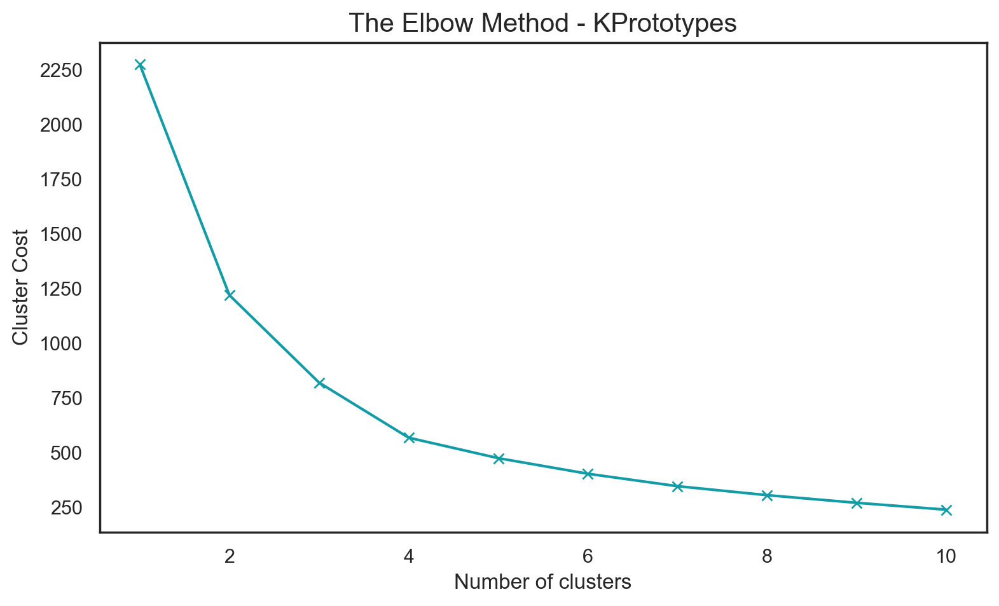

In [444]:
#Plot elbow plot
sns.set_style("white")
range_K=range(1,11)
plt.figure(figsize=(9,5))
plt.plot(range_K, cost_elbow, 'bx-',color='#139ba6')
pd.Series(cost_elbow,index=range_K)
plt.xlabel('Number of clusters')
plt.ylabel('Cluster Cost')
plt.title('The Elbow Method - KPrototypes', size=15)

plt.show()


In [355]:
kproto_2 = KPrototypes(n_clusters= 3, init='Huang', n_jobs = 1, random_state=42)
clusters_2 = kproto_2.fit_predict(df_c2, categorical=categorical_columns)

pd.Series(clusters_2).value_counts()

2    5901
0    4629
1    3995
Name: count, dtype: int64

In [356]:
clusters_2_df=pd.DataFrame(clusters_2+1,index=df_c2.index).rename(columns={0:'demographic_labels'})

In [357]:
clusters_2_df

,demographic_labels
ID,
10000,1
10001,3
10002,2
10003,2
10004,2
...,...
24937,2
24938,3
24939,2


In [358]:
demographic_labels = pd.concat([dataset[selected_features2], clusters_2_df], axis=1)
demographic_labels_means=demographic_labels.groupby('demographic_labels').mean()
demographic_labels_means

,Income,Gender,Recency
demographic_labels,,,
1,0.198637,1.00000,0.134386
2,0.191324,0.00000,0.193456
3,0.203000,0.68768,0.696205


In [359]:
demographic_labels_means.style.format(precision=2).background_gradient(axis=1)

,Income,Gender,Recency
demographic_labels,,,
1,0.20,1.00,0.13
2,0.19,0.00,0.19
3,0.20,0.69,0.70


<a class="anchor" id="c3">

## Clustering Method 3: Based on Activities
###### [Go back to Contents](#top)
</a>

1. Clustering for Activities:
2. Variables:
   - Athletics Activities
   - Water Activities
   - Fitness Activities
   - Team Activities
   - Racket Activities
   - Combat Activities
   - Special Activities
   - Other Activities
   - Number of Activities
3. Justification: These variables represent the participation of customers in different sports activities. Clustering based on these variables can help identify groups with similar preferences in terms of the types of sports they engage in


https://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.15.4028&rep=rep1&type=pdf    PARA A PARTE TEORICA DE SELF STUDY

In [101]:
#pip install kmodes

In [360]:
selected_features3=["AthleticsActivities", "WaterActivities", "FitnessActivities", "TeamActivities", "RacketActivities", "CombatActivities", "SpecialActivities",  "NumberofActivities"]
df_c3=dataset[selected_features3]
categorical_columns = [0, 1,2,3,4,5,6] #With k-prototypes you need to specify which columns are the categoricals in our case all but the last one

In [451]:
#Elbow plot
cost_elbow = []
for n_clus in range(1,11):
    kproto = KPrototypes(n_clusters= n_clus, init='Huang',n_jobs = 1)
    clusters = kproto.fit_predict(df_c3, categorical=categorical_columns)
    cost_elbow.append(kproto.cost_) 

In [452]:
cost_elbow

[468.0809959672971,
 232.46913592080324,
 157.97204450719389,
 121.7145230666382,
 87.32556665162039,
 94.1918359637735,
 56.542421706030815,
 47.658593910648364,
 35.534372606538305,
 29.457275160776646]

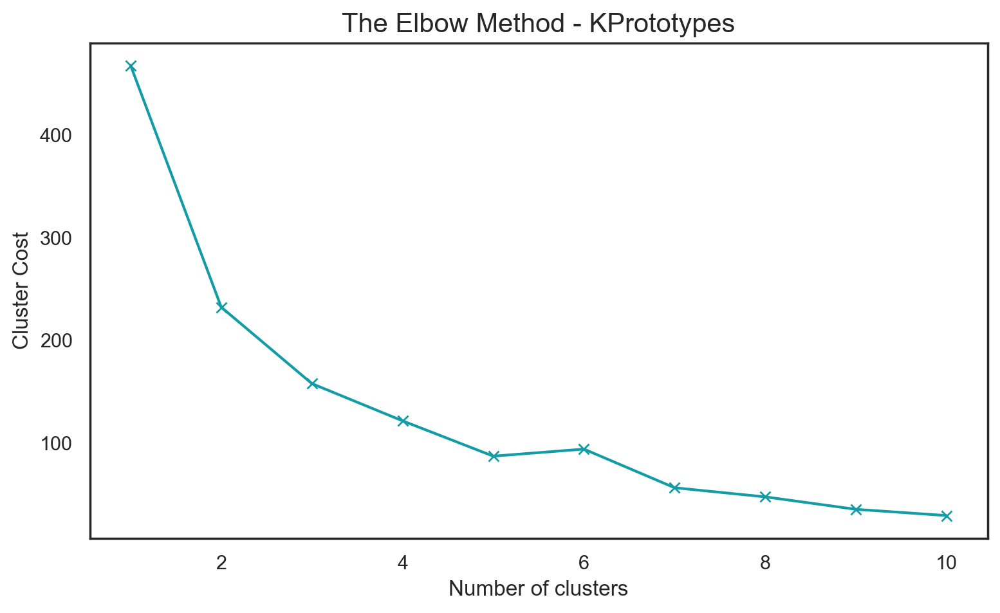

In [453]:
#Plot elbow plot
sns.set_style("white")
range_K=range(1,11)
plt.figure(figsize=(9,5))
plt.plot(range_K, cost_elbow, 'bx-',color='#139ba6')
pd.Series(cost_elbow,index=range_K)
plt.xlabel('Number of clusters')
plt.ylabel('Cluster Cost')
plt.title('The Elbow Method - KPrototypes', size=15)

plt.show()


In [361]:
kproto_3 = KPrototypes(n_clusters= 3, init='Huang', n_jobs = 1, random_state=42)
clusters_3 = kproto_3.fit_predict(df_c3, categorical=categorical_columns)

pd.Series(clusters_3).value_counts()

0    8858
1    4081
2    1586
Name: count, dtype: int64

In [362]:
clusters_3_df=pd.DataFrame(clusters_3+1,index=df_c3.index).rename(columns={0:'activities_labels'})

In [363]:
clusters_3_df

,activities_labels
ID,
10000,1
10001,1
10002,1
10003,1
10004,1
...,...
24937,2
24938,3
24939,1


In [364]:
activities_labels = pd.concat([dataset[selected_features3], clusters_3_df], axis=1)
activities_labels_means=activities_labels.groupby('activities_labels').mean()
activities_labels_means

,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,NumberofActivities
activities_labels,,,,,,,,
1,0.009483,0.00079,0.874125,0.070106,0.033303,0.000113,0.031497,0.203455
2,0.003185,1.0,0.09434,0.024994,0.003185,0.0,0.009802,0.227101
3,0.004414,0.069987,0.213745,0.02396,0.010719,0.988651,0.011349,0.265322


In [365]:
activities_labels_means.style.format(precision=2).background_gradient(axis=1)

,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,NumberofActivities
activities_labels,,,,,,,,
1,0.01,0.00,0.87,0.07,0.03,0.00,0.03,0.20
2,0.00,1.00,0.09,0.02,0.00,0.00,0.01,0.23
3,0.00,0.07,0.21,0.02,0.01,0.99,0.01,0.27


<a class="anchor" id="combine">

## Combining clusters with hierarchical
###### [Go back to Contents](#top)
</a>

The first step to use hierarchical is to only select the metric festures inside each cluster technique because it uses Euclidean

In [366]:
used_metric_features=["LifetimeValue", "NumberOfFrequencies", "NumberOfRenewals", "VisitsRatio", "AverageClassesperVisit","AttendedClasses","Income","Recency","NumberofActivities"]

In [367]:
# Adding cluster labels to the original datasets
dataset['value_labels'] = km_labels
dataset['demographics_labels'] = clusters_2
dataset['activities_labels'] =clusters_3

# Concatenating the three dataframes into a single dataframe for further analysis
#df_concatenated = pd.concat([df_based_value, df_based_demographics, df_based_activities], axis=1)
#df_concatenated

# Centroids of the concatenated cluster labels
df_centroids = dataset.groupby(['value_labels', 'demographics_labels', 'activities_labels']).mean()[used_metric_features]
df_centroids

LifetimeValue  \
value_labels demographics_labels activities_labels                  
0            0                   0                       0.034303   
                                 1                       0.046795   
                                 2                       0.041249   
             1                   0                       0.038386   
                                 1                       0.056157   
                                 2                       0.051253   
             2                   0                       0.031668   
                                 1                       0.053444   
                                 2                       0.049740   
1            0                   0                       0.244221   
                                 1                       0.348163   
                                 2                       0.368533   
             1                   0                       0.243862   
                                 1                       0.325786   
                                 2                       0.281191   
             2                   0                       0.185357   
                                 1                       0.221152   
                                 2                       0.135425   
2            0                   0                       0.118418   
                                 1                       0.187215   
                                 2                       0.145425   
             1                   0                       0.132682   
                                 1                       0.187336   
                                 2                       0.154977   
             2                   0                       0.066643   
                                 1                       0.105876   
                                 2                       0.098699   
3            0                   0                       0.073983   
                                 1                       0.103057   
                                 2                       0.101849   
             1                   0                       0.091288   
                                 1                       0.112325   
                                 2                       0.112571   
             2                   0                       0.077221   
                                 1                       0.085281   
                                 2                       0.085021   

                                                    NumberOfFrequencies  \
value_labels demographics_labels activities_labels                        
0            0                   0                             0.026204   
                                 1                             0.026030   
                                 2                             0.013442   
             1                   0                             0.034299   
                                 1                             0.035331   
                                 2                             0.019138   
             2                   0                             0.026130   
                                 1                             0.027567   
                                 2                             0.021045   
1            0                   0                             0.133174   
                                 1                             0.135421   
                                 2                             0.120086   
             1                   0                             0.088743   
                                 1                             0.131284   
                                 2                             0.089609   
             2                   0                             0.069435   
                                 1                             0.090186   
    

In [368]:
# Using Hierarchical clustering to merge the concatenated cluster centroids
linkage = 'ward'
hclust = AgglomerativeClustering(
    linkage=linkage, 
    metric='euclidean', 
    distance_threshold=0, 
    n_clusters=None
  
)
hclust_labels = hclust.fit_predict(df_centroids)

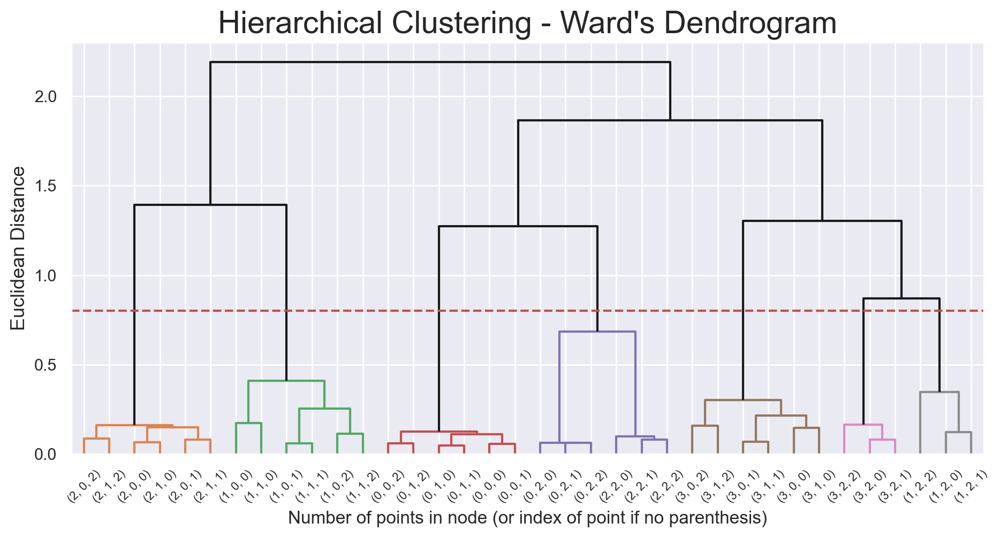

In [369]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 0.8
dendrogram(linkage_matrix, 
           truncate_mode='level', 
           labels=df_centroids.index, p=5, 
           color_threshold=y_threshold, 
           above_threshold_color='k')

plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [386]:
# Re-running the Hierarchical clustering based on the correct number of clusters
hclust = AgglomerativeClustering(
    linkage='ward', 
    metric='euclidean', 
    n_clusters=8
)
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

df_centroids  # centroid's cluster labels

LifetimeValue  \
value_labels demographics_labels activities_labels                  
0            0                   0                       0.034303   
                                 1                       0.046795   
                                 2                       0.041249   
             1                   0                       0.038386   
                                 1                       0.056157   
                                 2                       0.051253   
             2                   0                       0.031668   
                                 1                       0.053444   
                                 2                       0.049740   
1            0                   0                       0.244221   
                                 1                       0.348163   
                                 2                       0.368533   
             1                   0                       0.243862   
                                 1                       0.325786   
                                 2                       0.281191   
             2                   0                       0.185357   
                                 1                       0.221152   
                                 2                       0.135425   
2            0                   0                       0.118418   
                                 1                       0.187215   
                                 2                       0.145425   
             1                   0                       0.132682   
                                 1                       0.187336   
                                 2                       0.154977   
             2                   0                       0.066643   
                                 1                       0.105876   
                                 2                       0.098699   
3            0                   0                       0.073983   
                                 1                       0.103057   
                                 2                       0.101849   
             1                   0                       0.091288   
                                 1                       0.112325   
                                 2                       0.112571   
             2                   0                       0.077221   
                                 1                       0.085281   
                                 2                       0.085021   

                                                    NumberOfFrequencies  \
value_labels demographics_labels activities_labels                        
0            0                   0                             0.026204   
                                 1                             0.026030   
                                 2                             0.013442   
             1                   0                             0.034299   
                                 1                             0.035331   
                                 2                             0.019138   
             2                   0                             0.026130   
                                 1                             0.027567   
                                 2                             0.021045   
1            0                   0                             0.133174   
                                 1                             0.135421   
                                 2                             0.120086   
             1                   0                             0.088743   
                                 1                             0.131284   
                                 2                             0.089609   
             2                   0                             0.069435   
                                 1                             0.090186   
    

In [387]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['hclust_labels'].to_dict()

df_ = dataset.copy()

# Mapping the hierarchical clusters on the centroids to the observations
df_['merged_labels'] = df_.apply(
    lambda row: cluster_mapper[(row['value_labels'], row['demographics_labels'], row['activities_labels']) ], axis=1)

# Merged cluster centroids
df_.groupby('merged_labels').mean()[metric_features]

,Age,Income,DaysWithoutFrequency,LifetimeValue,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,NumberOfReferences,EnrollmentLenght,LastPeriodLenght,VisitsRatio,AverageClassesperVisit,NumberofActivities,Recency
merged_labels,,,,,,,,,,,,,,,,,
0,0.251561,0.145943,0.053518,0.240584,0.096693,0.129653,0.349315,0.135209,0.044901,0.714155,0.030441,0.537245,0.274185,0.098876,0.487823,0.242009,0.277143
1,0.194549,0.092868,0.028337,0.265875,0.103412,0.162734,0.293793,0.118794,0.061102,0.584715,0.029781,0.494293,0.124286,0.127090,0.508630,0.224327,0.095376
2,0.217745,0.129079,0.027800,0.130474,0.071487,0.048534,0.431460,0.154496,0.074934,0.317880,0.004896,0.262524,0.166422,0.131471,0.372900,0.230013,0.142579
3,0.351926,0.243511,0.037133,0.102057,0.096246,0.000815,0.987027,0.282131,0.089367,0.424974,0.000867,0.344013,0.168382,0.074302,0.003836,0.227680,0.170759
4,0.293810,0.200461,0.054814,0.045507,0.025849,0.009531,0.820082,0.226335,0.061249,0.107617,0.006544,0.109811,0.225661,0.072189,0.111913,0.207067,0.710967
5,0.328531,0.226764,0.050261,0.048201,0.040048,0.000700,0.955672,0.256385,0.089565,0.161047,0.000873,0.138122,0.156360,0.085874,0.007753,0.206178,0.321956
6,0.321506,0.223426,0.069712,0.131999,0.077603,0.002955,0.960751,0.291784,0.053185,0.527645,0.005119,0.372757,0.226114,0.045410,0.014585,0.289420,0.351840
7,0.321364,0.221024,0.026137,0.040554,0.025700,0.003227,0.916601,0.264579,0.080482,0.064724,0.000580,0.087274,0.149433,0.073909,0.048373,0.205481,0.156451


In [388]:
df_.head()

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,EnrollmentLenght,LastPeriodLenght,Recency,NumberofActivities,VisitsRatio,AverageClassesperVisit,value_labels,demographics_labels,activities_labels,merged_labels
ID,,,,,,,,,,,,,,,,,,,,,
10000,0.689655,1,0.505051,0.000573,0.025540,0,0,0,1,0,...,0.024631,0.008197,0.000514,0.2,0.173368,0.447489,3,0,0,1
10001,0.333333,1,0.241506,0.034384,0.136977,0,0,0,0,0,...,0.192118,0.502732,0.805755,0.2,0.031250,0.025015,2,2,0,5
10002,0.264368,0,0.181818,0.004011,0.010748,0,0,0,1,0,...,0.010837,0.000000,0.456835,0.2,0.108766,0.000000,0,1,0,5
10003,0.103448,0,0.000000,0.012607,0.044420,0,0,0,0,1,...,0.074877,0.502732,0.145427,0.2,0.092163,0.057534,0,1,0,5
10004,0.402299,0,0.396694,0.120344,0.106677,0,0,0,1,0,...,0.379310,0.000000,0.370504,0.2,0.000000,0.000000,2,1,0,3


In [389]:
# Merge cluster contingency table
# Getting size of each final cluster
df_counts = df_.groupby('merged_labels').size().to_frame()

# Getting the product and behavior labels
df_counts = df_counts.rename({v: k for k, v in cluster_mapper.items()}).reset_index()

# Extracting the labels from the merged_labels
df_counts['value_labels'] = df_counts['merged_labels'].apply(lambda x: x[0])
df_counts['demographics_labels'] = df_counts['merged_labels'].apply(lambda x: x[1])
df_counts['activities_labels'] = df_counts['merged_labels'].apply(lambda x: x[2])


df_counts.pivot_table(values=0, index=['value_labels', 'demographics_labels'], columns='activities_labels')


activities_labels                      0       1       2
value_labels demographics_labels                        
1            2                       NaN     NaN   219.0
2            1                    1922.0     NaN     NaN
             2                    1910.0     NaN   586.0
3            1                    2299.0  1566.0   929.0
             2                       NaN     NaN  5094.0

In [390]:
dataset=df_.copy()

<a class="anchor" id="ana">

## Clustering Analysis
###### [Go back to Contents](#top)
</a>

In [391]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

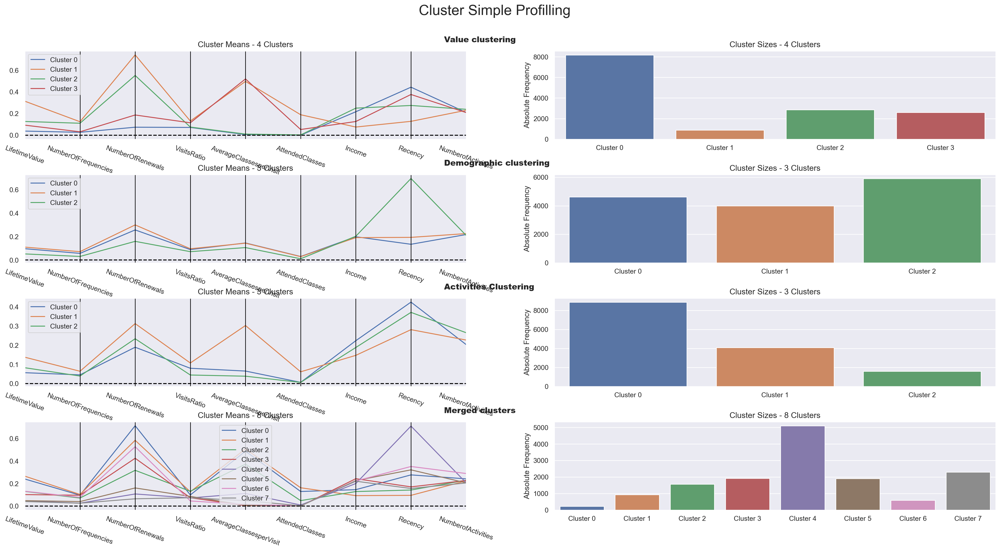

In [392]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = dataset[used_metric_features + ['value_labels', 'demographics_labels','activities_labels','merged_labels']], 
    label_columns = ['value_labels', 'demographics_labels','activities_labels','merged_labels'], 
    figsize = (28, 13), 
    compar_titles = ["Value clustering", "Demographic clustering","Activities Clustering", "Merged clusters"]
)

Visualizing with some non-metric features

In [393]:
df_visualization = dataset[['merged_labels','Gender','FitnessActivities', 'WaterActivities', 'Dropout','UseByTime']].groupby(['merged_labels']).sum()

df_visualization

,Gender,FitnessActivities,WaterActivities,Dropout,UseByTime
merged_labels,,,,,
0,134,45,76,148,3
1,602,121,685,411,11
2,822,170,1566,937,87
3,904,1401,20,1352,219
4,3458,3288,948,5094,134
5,353,1525,299,1600,93
6,276,186,188,461,52
7,2138,1731,417,1703,85


In [394]:
dataset[['merged_labels']].groupby(['merged_labels']).value_counts()

merged_labels
0     219
1     929
2    1566
3    1922
4    5094
5    1910
6     586
7    2299
Name: count, dtype: int64

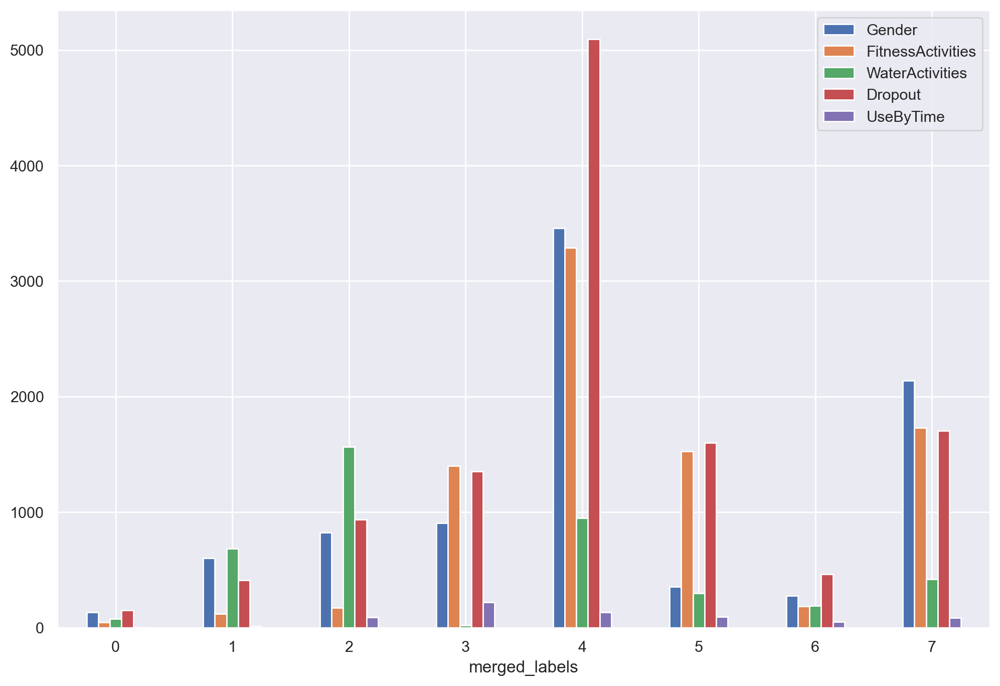

In [395]:
fig, ax = plt.subplots(figsize=(12,8))
df_visualization.plot(kind='bar', stacked=False, ax=ax)
plt.xticks(rotation=0)
plt.show()

### T-SNE Visualization

In [396]:
two_dim = TSNE(random_state=42).fit_transform(dataset[used_metric_features])

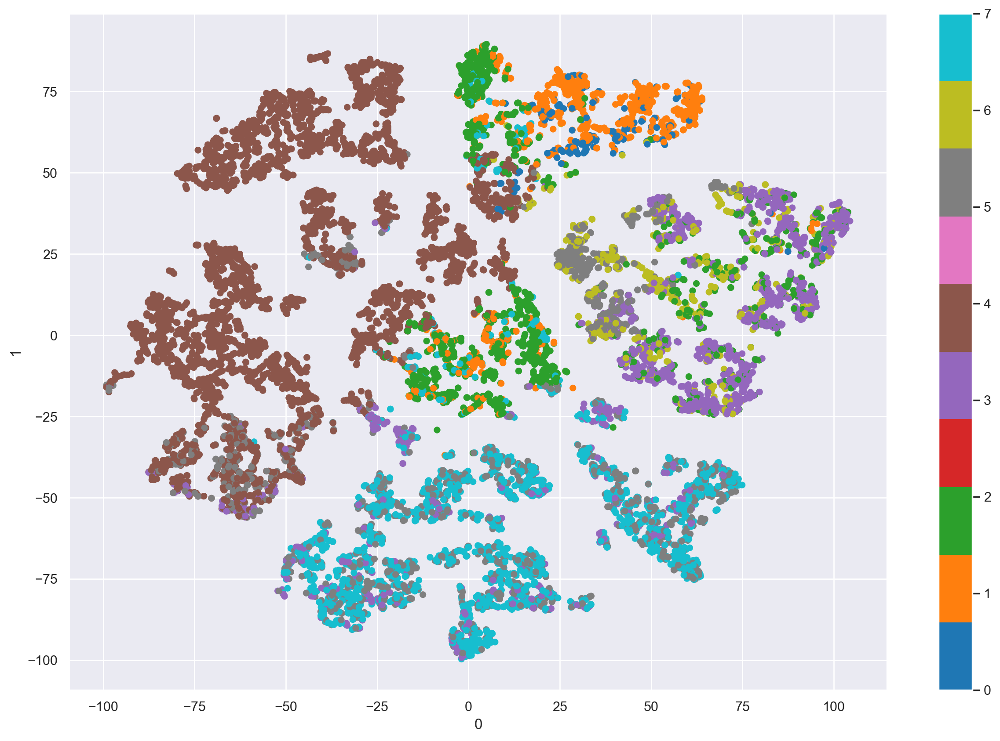

In [397]:
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=dataset['merged_labels'], colormap='tab10', figsize=(15,10))
plt.show()

<a class="anchor" id="dt">

## Outliers Reintroduction
###### [Go back to Contents](#top)
</a>

In [398]:
# Preparing the data
X = dataset.drop(columns=['value_labels', 'demographics_labels','activities_labels','merged_labels'])
y = dataset.merged_labels

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Fitting the decision tree
dt = DecisionTreeClassifier(random_state=42, max_depth=3)
dt.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(dt.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 72.63% of the customers correctly


In [399]:
 #Predicting the cluster labels of the outliers
df_for_outliers.drop('dbscan_labels', axis=1, inplace=True)
df_for_outliers['merged_labels'] = dt.predict(df_for_outliers)
df_for_outliers.head()

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,HasReferences,NumberOfReferences,Dropout,EnrollmentLenght,LastPeriodLenght,Recency,NumberofActivities,VisitsRatio,AverageClassesperVisit,merged_labels
ID,,,,,,,,,,,,,,,,,,,,,
10262,0.265625,1,0.117886,0.078998,0.220792,0,0,1,0,0,...,1,1.0,1,0.748825,0.008197,0.050218,0.0,0.059244,0.492373,1
10409,0.281250,1,0.167683,0.000000,0.098626,0,0,1,0,0,...,0,0.0,0,0.610444,0.008197,0.000000,0.0,1.000000,0.329843,1
10680,0.703125,0,0.319106,0.000000,0.462081,0,0,1,0,0,...,0,0.0,0,0.984856,0.008197,0.000000,1.0,0.277644,0.005765,3
11158,0.375000,0,0.202236,0.204239,0.019252,0,0,1,0,0,...,0,0.0,1,0.080940,1.000000,0.879913,0.0,0.001640,0.000000,4
11265,0.000000,1,0.000000,0.009634,0.002412,0,0,1,0,0,...,0,0.0,0,0.008877,0.008197,0.002729,0.0,0.091765,1.000000,2
